In [11]:
import sys
import os
absFilePath = os.path.abspath('example_state_switching.py')
fileDir = os.path.dirname(absFilePath)
parentDir = os.path.dirname(fileDir)

import func_pytorch as functions
from opt_pytorch import FR_algorithm

import torch
import pickle
import matplotlib.pyplot as plt
from pylab import figure, cm
import random
seed=50
random.seed(seed)

goal='sync'
bifurcation='high'
noise_strength= 0.0 
realizations=1
noise=0
parameters = functions.set_parameters(goal,bifurcation,parentDir)

# 10 nodes
n_nodes = 10
A = parameters['A'][:n_nodes,:n_nodes]
#A = np.zeros((5,5))
parameters['A'] = A
parameters['N'] = n_nodes


#Set dimensions
T= 400 #simulation and control time 
dt=0.1 #time stepsize
tsteps=int(T/dt) #number of timesteps
d=2 #dimension of each FitzHugh-Nagumo node

#set paraeters of the cost functional
I_p_in= 0.0005 #penalize precision
I_e= 1.0 #penalize control energy should be >0
I_s= 0.0#enforce sparsity

switchfromto='none'
I_p=I_p_in

#choose initial condition for control
control=-torch.ones((tsteps,parameters['N']))*0.002
control=control.reshape(tsteps*parameters['N'])

def set_random_initial_conds_for_nodes(bifurcation,noise_strength,tsteps,d,dt,parameters,realizations,noise):

    #unpack parameters
    alpha=parameters['alpha']
    beta=parameters['beta']
    gamma=parameters['gamma']
    delta=parameters['delta']
    epsilon=parameters['epsilon']
    tau=parameters['tau']
    sigma=parameters['sigma']
    mu=parameters['mu']
    A=parameters['A']
    N=parameters['N']

    #set random initials on circle with set amplitudes
    if bifurcation=='low':
        ini_y=torch.rand(N)/2+0.1
        ini_z=torch.rand(N)/5+.5
    elif bifurcation=='high':
        ini_y=torch.rand(N)
        ini_z=torch.rand(N)*0.3+1.0
    
    ini_transient=torch.stack((ini_y, ini_z)).transpose(0, 1)
    ini_transient=ini_transient.reshape(2,N)
    #print(ini_transient)

    return ini_transient

node_ic=functions.set_random_initial_conds_for_nodes(bifurcation,noise_strength,tsteps,d,dt,parameters,realizations,noise)
#ic_state_high=functions.set_random_initial_conds_for_nodes('high',noise_strength,tsteps,d,dt,parameters_high,realizations,noise)
target_output=torch.ones((parameters['N'],parameters['N']))

args = {
    'tsteps':tsteps,
    'dt':dt,
    'd':d,
    'I_p':I_p,
    'I_e':I_e,
    'I_s':I_s,
    'target_output':target_output,
    'node_ic':node_ic,
    'realizations':realizations,
    'noise':noise
    }
args.update(parameters)

In [12]:
def create_plot(data,ylabel,title):
    fs=30 #fontsize
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10,5))

    # set min and max for scope of y-axis
    minn=torch.min(data)
    maxx=torch.max(data)
    add=(maxx-minn)/25

    im1=ax.plot(torch.arange(0,int(T),dt),data)
    ax.set_xlabel('t',size=fs)
    ax.set_ylabel(ylabel,size=fs)
    ax.set_ylim(minn-add,maxx+add)
    ax.set_title(title,size=fs, pad=20)
    ax.tick_params(labelsize=fs)
    ax.grid(True)
    ax.margins(0) # remove default margins (matplotlib verision 2+)

    return fig.tight_layout()

In [104]:
def create_plot(data,ylabel,title):
    fs=30 #fontsize
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10,5))

    # set min and max for scope of y-axis
    minn=torch.min(data)
    maxx=torch.max(data)
    add=(maxx-minn)/25

    im1=ax.plot(torch.arange(0,int(dt*data.shape[0]),dt),data)
    ax.set_xlabel('t',size=fs)
    ax.set_ylabel(ylabel,size=fs)
    ax.set_ylim(minn-add,maxx+add)
    ax.set_title(title,size=fs, pad=20)
    ax.tick_params(labelsize=fs)
    ax.grid(True)
    ax.margins(0) # remove default margins (matplotlib verision 2+)

    return fig.tight_layout()

In [13]:
nocontrol=torch.zeros((tsteps,parameters['N']))
state_uncontrolled=functions.plot_runge_kutta(functions.ODE_FHN_network,nocontrol, **args)

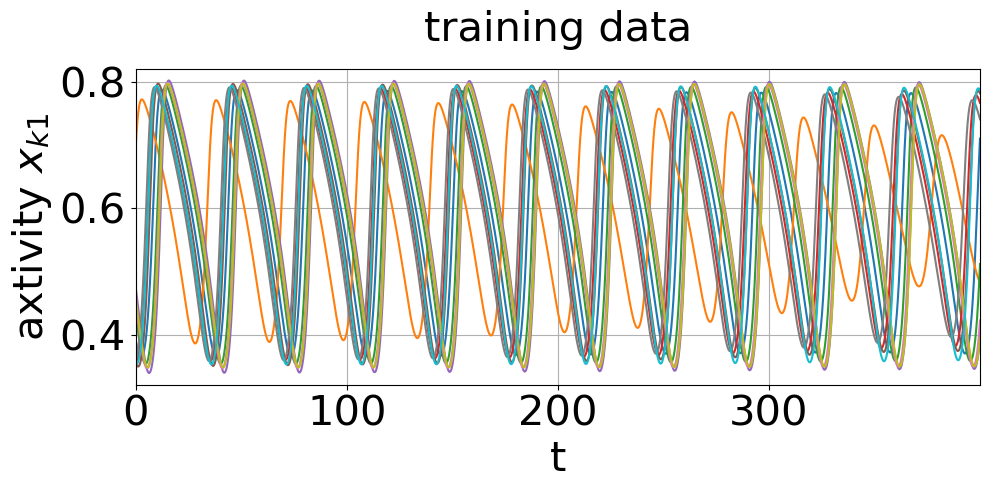

In [14]:
create_plot(state_uncontrolled[:,0,:],'axtivity $x_{k1}$','training data')
plt.show()

In [15]:
randcontrol=0.1*torch.rand((tsteps,parameters['N']))
state_randcontrolled=functions.plot_runge_kutta(functions.ODE_FHN_network,randcontrol, **args)

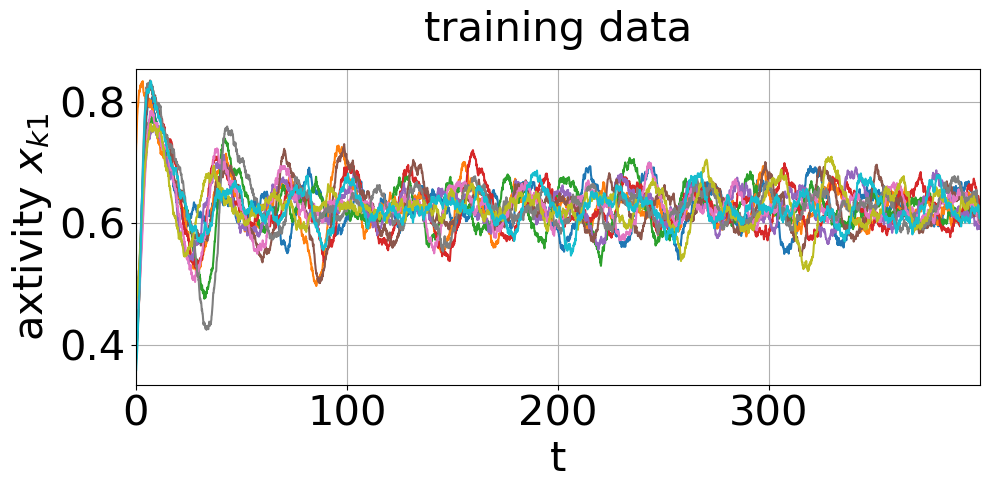

In [16]:
create_plot(state_randcontrolled[:,0,:],'axtivity $x_{k1}$','training data')
plt.show()

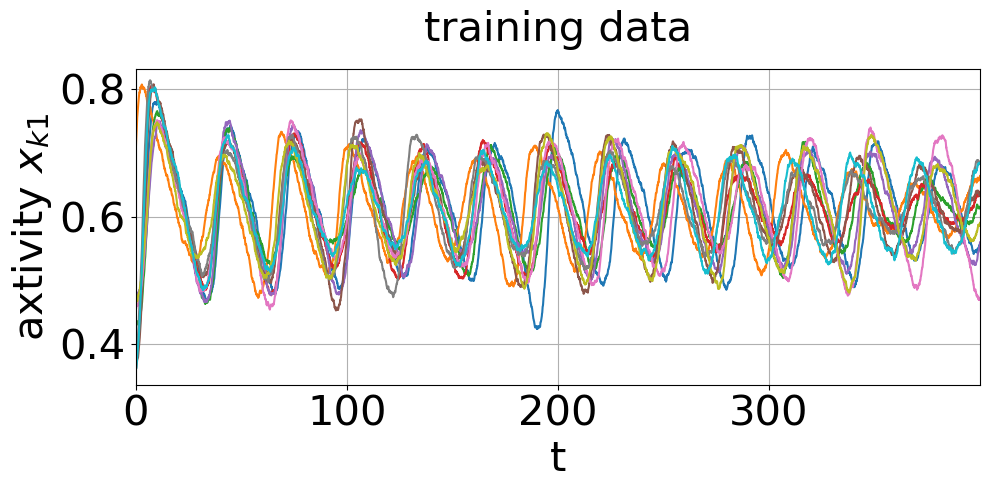

In [17]:
randcontrol2=0.05*torch.rand((tsteps,parameters['N']))
state_randcontrolled2=functions.plot_runge_kutta(functions.ODE_FHN_network,randcontrol2, **args)
create_plot(state_randcontrolled2[:,0,:],'axtivity $x_{k1}$','training data')
plt.show()

In [18]:
import torch
from torch import nn
from torch.nn import Sequential, Linear, ReLU
from torch_geometric.utils import scatter
from torch_geometric.nn import MetaLayer

In [75]:
trajectories = [(state_uncontrolled[:1000,:,:],nocontrol[:1000,:]),(state_randcontrolled,randcontrol),(state_randcontrolled2,randcontrol2)]
for (tr,c) in trajectories:
    print(tr.shape,c.shape)

torch.Size([1000, 2, 10]) torch.Size([1000, 10])
torch.Size([4000, 2, 10]) torch.Size([4000, 10])
torch.Size([4000, 2, 10]) torch.Size([4000, 10])


In [76]:
from torch.utils.data import DataLoader, TensorDataset, random_split

look_back = 10 # the number of previous time steps to use as input variables to predict the next time period
look_forward = 10 # k steps ahead
data = []

for (trajectory,c) in trajectories:
    for i in range(len(trajectory) - (look_back+look_forward)):
        state, control, next_state = trajectory[i:i+look_back,:,:], c[i:i+look_back,:], trajectory[i+look_back:i+look_back+look_forward,:,:]
        data.append((state, control, next_state))

# Convert data to PyTorch tensors and create a DataLoader for batching
states, controls, next_states = zip(*data)
states_tensor = torch.stack(states)
controls_tensor = torch.stack(controls)
next_states_tensor = torch.stack(next_states)
dataset = TensorDataset(states_tensor, controls_tensor, next_states_tensor)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1)

In [22]:
adj = torch.ones(n_nodes,n_nodes)
torch.diagonal(adj, 0).zero_()
edge_index = adj.nonzero().t().contiguous()
edge_attr = A[edge_index[0], edge_index[1]]

$$
\begin{aligned}
& \frac{d}{d t} x_{k 1}(t)=h_1\left(\boldsymbol{x}_k(t)\right)+\sigma \sum_{i=1}^N \boldsymbol{A}_{k i} x_{i 1}(t)+\xi_k(t)+u_k(t) \\
& \frac{d}{d t} x_{k 2}(t)=h_2\left(\boldsymbol{x}_k(t)\right)
\end{aligned}
$$

$x_{k 1}(t)=\sum_{i=1}^N \boldsymbol{A}_{k i} x_{i 1}(t)$

### k-step prediction

In [109]:
class EdgeModel(torch.nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, src, dst, edge_attr,u=None,batch=None):
        # src, dst: [E, F_x], where E is the number of edges.
        # edge_attr: [E, F_e]
        # u: [B, F_u], where B is the number of graphs.
        # batch: [E] with max entry B - 1.
        #if edge_attr.dim() == 1:
            #edge_attr = edge_attr.view(-1, 1)
        #print(dst[:,0,:].shape,edge_attr.shape)
        #print(dst[:,0].shape,edge_attr.shape)
        dst[:,0] = dst[:,0] * edge_attr
        

        return dst

class NodeModel(torch.nn.Module):
    def __init__(self):
        super().__init__()
        in_channels = 2*3
        hiddens = 2*in_channels
        self.node_mlp_1 = Sequential(
            nn.Linear(in_channels, hiddens),
            nn.ReLU(),
            nn.Linear(hiddens, 2*hiddens),
            nn.ReLU(),
            nn.Linear(2*hiddens, in_channels))
        num_node_features = 2
        self.node_mlp_2 = Sequential(
            nn.Linear(3*3, 2*hiddens),
            nn.ReLU(),
            nn.Linear(2*hiddens, num_node_features))

    def forward(self, x, edge_index, edge_attr,u=None,batch=None):
        # x: [N, F_x], where N is the number of nodes.
        # edge_index: [2, E] with max entry N - 1.
        # edge_attr: [E, F_e]
        # u: [B, F_u]
        # batch: [N] with max entry B - 1.
        row, col = edge_index
        #print(x[row].shape,edge_attr.shape)
        out = torch.cat([x[row], edge_attr], dim=1)
        print(out.shape)
        out = self.node_mlp_1(out)
        #print(out.shape)
        out = scatter(out, col, dim=0, dim_size=x.size(0),
                      reduce='mean')
        #print(x.shape,out.shape)
        out = torch.cat([x, out], dim=1)
        return self.node_mlp_2(out)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = MetaLayer(EdgeModel(), NodeModel()).to(device)
data = state_uncontrolled.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=5e-4)
loss_fn = nn.MSELoss()

train_losses = []  
val_losses = []
epochs = 50
for epoch in range(epochs):
    model.train()
    total_loss = 0
    for states, controls, next_states in train_loader:
        states, controls, next_states = states.to(device), controls.to(device), next_states.to(device).squeeze(0)
        controls_expanded = controls.unsqueeze(2)
        state_control = torch.cat((states, controls_expanded), dim=2).squeeze(0)
        optimizer.zero_grad()
        out = model(state_control.T,edge_index,edge_attr)
        loss = loss_fn(out[0], next_states.T)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    avg_train_loss = total_loss / len(train_loader)
    train_losses.append(avg_train_loss) 
    if (epoch + 1) % 10 == 0: 
        print(f"Epoch {epoch + 1}/{epochs}, Loss: {total_loss / len(train_loader)}")

    # Validation (optional but recommended)
    model.eval()
    with torch.no_grad():
        val_loss = 0
        for states, controls, next_states in val_loader:
            states, controls, next_states = states.to(device), controls.to(device), next_states.to(device).squeeze(0)
            controls_expanded = controls.unsqueeze(2)
            state_control = torch.cat((states, controls_expanded), dim=2).squeeze(0)
            out = model(state_control.T,edge_index,edge_attr)
            loss = loss_fn(out[0], next_states.T)
            val_loss += loss.item()
        avg_val_loss = val_loss / len(val_loader)
        val_losses.append(avg_val_loss)
        if (epoch + 1) % 10 == 0: 
            print(f"Validation Loss: {val_loss / len(val_loader)}")

In [71]:
class EdgeModel(torch.nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, src, dst, edge_attr,u=None,batch=None):
        # src, dst: [E, F_x], where E is the number of edges.
        # edge_attr: [E, F_e]
        # u: [B, F_u], where B is the number of graphs.
        # batch: [E] with max entry B - 1.
        #if edge_attr.dim() == 1:
            #edge_attr = edge_attr.view(-1, 1)
        #print(dst.shape,dst[:,0,:].shape,edge_attr.shape)
        #print(dst[:,0].shape,edge_attr.shape)
        for i in range(look_back):
            dst[:,0,i] = dst[:,0,i] * edge_attr
        dst = dst.contiguous().view(dst.size(0), -1)
        return dst

class NodeModel(torch.nn.Module):
    def __init__(self):
        super().__init__()
        in_channels = 4*look_back
        hiddens = in_channels*2
        self.node_mlp_1 = Sequential(
            nn.Linear(in_channels, hiddens),
            nn.ReLU(),
            nn.Linear(hiddens, 2*hiddens),
            nn.ReLU(),
            nn.Linear(2*hiddens, in_channels))
        num_node_features = 2*look_forward
        self.node_mlp_2 = Sequential(
            nn.Linear(6*look_back, 2*hiddens),
            nn.ReLU(),
            nn.Linear(2*hiddens, num_node_features))

    def forward(self, x, edge_index, edge_attr,u=None,batch=None):
        # x: [N, F_x], where N is the number of nodes.
        # edge_index: [2, E] with max entry N - 1.
        # edge_attr: [E, F_e]
        # u: [B, F_u]
        # batch: [N] with max entry B - 1.
        row, col = edge_index
        x = x.contiguous().view(x.size(0), -1)
        #print(x[row].shape,edge_attr.shape)
        out = torch.cat([x[row], edge_attr], dim=1)
        #out = out.view(out.size(0), -1)
        out = self.node_mlp_1(out)
        out = scatter(out, col, dim=0, dim_size=x.size(0),
                      reduce='mean')
        out = torch.cat([x, out], dim=1)
        out = self.node_mlp_2(out)
        out = out.view(n_nodes, 2, look_forward)
        return out

In [77]:
class EdgeModel(torch.nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, src, dst, edge_attr,u=None,batch=None):
        # src, dst: [E, F_x], where E is the number of edges.
        # edge_attr: [E, F_e]
        # u: [B, F_u], where B is the number of graphs.
        # batch: [E] with max entry B - 1.
        #if edge_attr.dim() == 1:
            #edge_attr = edge_attr.view(-1, 1)
        #print(dst.shape,dst[:,0,:].shape,edge_attr.shape)torch.Size([90, 3, 10]) torch.Size([90, 10]) torch.Size([90])
        #print(dst[:,0].shape,edge_attr.shape)
        out = dst.clone()
        for i in range(look_back):
            out[:,0,i] = dst[:,0,i] * edge_attr
        out = out.contiguous().view(out.size(0), -1)
        return out

class NodeModel(torch.nn.Module):
    def __init__(self):
        super().__init__()
        in_channels = 2*look_back*3
        hiddens = in_channels*2
        self.node_mlp_1 = Sequential(
            nn.Linear(in_channels, hiddens),
            nn.ReLU(),
            nn.Linear(hiddens, 2*hiddens),
            nn.ReLU(),
            nn.Linear(2*hiddens, in_channels))
        num_node_features = 2*look_forward
        self.node_mlp_2 = Sequential(
            nn.Linear(3*look_back*3, 2*hiddens),
            nn.ReLU(),
            nn.Linear(2*hiddens, num_node_features))

    def forward(self, x, edge_index, edge_attr,u=None,batch=None):
        # x: [N, F_x], where N is the number of nodes.
        # edge_index: [2, E] with max entry N - 1.
        # edge_attr: [E, F_e]
        # u: [B, F_u]
        # batch: [N] with max entry B - 1.
        row, col = edge_index
        x = x.contiguous().view(x.size(0), -1)
        #print(x[row].shape,edge_attr.shape)
        out = torch.cat([x[row], edge_attr], dim=1)
        #out = out.view(out.size(0), -1)
        out = self.node_mlp_1(out)
        out = scatter(out, col, dim=0, dim_size=x.size(0),
                      reduce='mean')
        out = torch.cat([x, out], dim=1)
        out = self.node_mlp_2(out)
        out = out.view(n_nodes, 2, look_forward)
        return out

In [8]:
look_back = 9 # the number of previous time steps to use as input variables to predict the next time period
look_forward = 5 # k steps ahead

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = MetaLayer(EdgeModel(), NodeModel()).to(device)
model.load_state_dict(torch.load('b9f5_l2'))

<All keys matched successfully>

In [ ]:
for states, controls, next_states in train_loader:
    states, controls, next_states = states.to(device), controls.to(device), next_states.to(device)
    print(states.shape, controls.shape, next_states.shape)

In [24]:
look_back

10

In [78]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = MetaLayer(EdgeModel(), NodeModel()).to(device)
data = state_uncontrolled.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=5e-4)
loss_fn = nn.MSELoss()

train_losses = []  
val_losses = []
epochs = 50
for epoch in range(epochs):
    model.train()
    total_loss = 0
    for states, controls, next_states in train_loader:
        states, controls, next_states = states.to(device), controls.to(device), next_states.to(device).squeeze(0)
        controls_expanded = controls.unsqueeze(2)
        state_control = torch.cat((states, controls_expanded), dim=2).squeeze(0)
        optimizer.zero_grad()
        out = model(state_control.T,edge_index,edge_attr)
        loss = loss_fn(out[0], next_states.T)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    avg_train_loss = total_loss / len(train_loader)
    train_losses.append(avg_train_loss) 
    if (epoch + 1) % 10 == 0: 
        print(f"Epoch {epoch + 1}/{epochs}, Loss: {total_loss / len(train_loader)}")

    # Validation (optional but recommended)
    model.eval()
    with torch.no_grad():
        val_loss = 0
        for states, controls, next_states in val_loader:
            states, controls, next_states = states.to(device), controls.to(device), next_states.to(device).squeeze(0)
            controls_expanded = controls.unsqueeze(2)
            state_control = torch.cat((states, controls_expanded), dim=2).squeeze(0)
            out = model(state_control.T,edge_index,edge_attr)
            loss = loss_fn(out[0], next_states.T)
            val_loss += loss.item()
        avg_val_loss = val_loss / len(val_loader)
        val_losses.append(avg_val_loss)
        if (epoch + 1) % 10 == 0: 
            print(f"Validation Loss: {val_loss / len(val_loader)}")

Epoch 10/50, Loss: 0.00022885456213144574
Validation Loss: 0.00018437934009767596
Epoch 20/50, Loss: 0.00021523784549575716
Validation Loss: 0.0002219252427945907
Epoch 30/50, Loss: 0.00020777238545729366
Validation Loss: 0.0001869972518484928
Epoch 40/50, Loss: 0.0002064898255782935
Validation Loss: 0.00019653216879297409
Epoch 50/50, Loss: 0.00020384450384347503
Validation Loss: 0.00019553589461557288


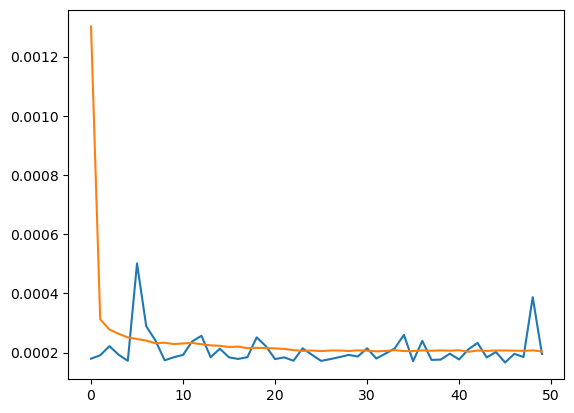

In [79]:
plt.plot(val_losses)
plt.plot(train_losses)
plt.show()

In [80]:
print(train_losses, val_losses)

[0.0013017337555481464, 0.00031252667590581925, 0.00027796600203048053, 0.00026347631628534954, 0.0002514958610338484, 0.0002460197189036591, 0.00024062858335214076, 0.0002316447711452599, 0.0002335884825862384, 0.00022885456213144574, 0.00023111741816025605, 0.00023262011692825213, 0.00022844589473477702, 0.00022446097976324694, 0.0002231027467624288, 0.00021913588089141566, 0.00022034330504933173, 0.00021503596546547057, 0.0002162032383154219, 0.00021523784549575716, 0.0002143316151579123, 0.00021256413263892653, 0.00020853673125238592, 0.0002058333921324958, 0.00020719789772090966, 0.0002053112524567055, 0.00020725772624113767, 0.00020722115508035042, 0.00020560704661105596, 0.00020777238545729366, 0.0002064944120624107, 0.0002044500514730459, 0.0002056645457636431, 0.00020823032316541032, 0.00020539028253720173, 0.00020522934926502459, 0.00020753524833638893, 0.00020619079373331245, 0.00020763186643576139, 0.0002064898255782935, 0.0002080951152528932, 0.00020287859190243205, 0.0002

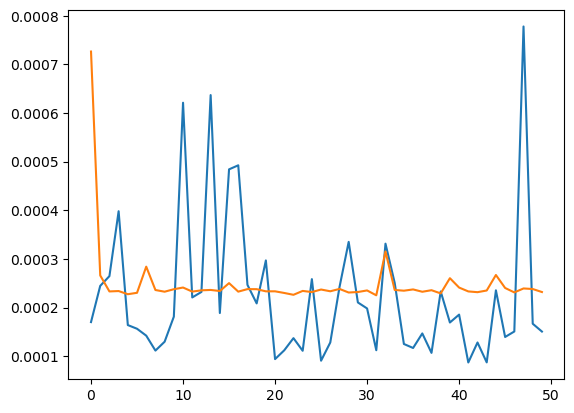

In [80]:
plt.plot(val_losses)
plt.plot(train_losses)
plt.show()

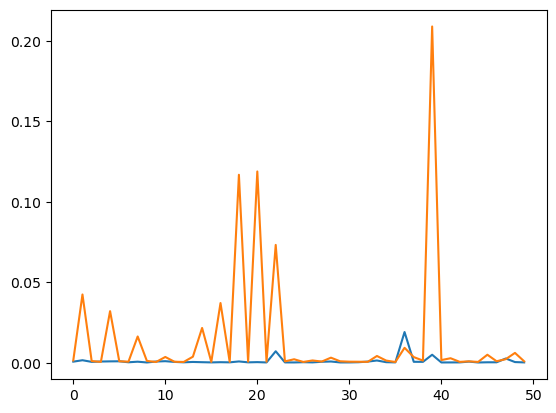

In [106]:
plt.plot(val_losses)
plt.plot(train_losses)
plt.show()

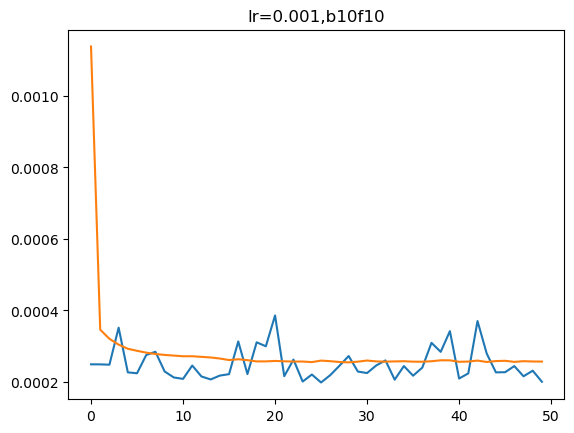

In [132]:
plt.plot(val_losses)
plt.plot(train_losses)
plt.title('lr=0.001,b10f10')
plt.show()

In [81]:
model.eval()
data = state_uncontrolled.to(device)
pred_traj = torch.zeros(500,2,10)
pred_traj[:look_back,:,:] = state_uncontrolled[:look_back,:,:]
nocontrol_test = torch.zeros(look_back,n_nodes).unsqueeze(1) 
for i in range(500-(look_back+look_forward)):
    x = torch.cat((pred_traj[i:i+look_back,:,:], nocontrol_test), dim=1)
    pred = model(x.T,edge_index,edge_attr)[0]
    pred_traj[i+look_back:i+look_back+look_forward,:,:] = pred.T

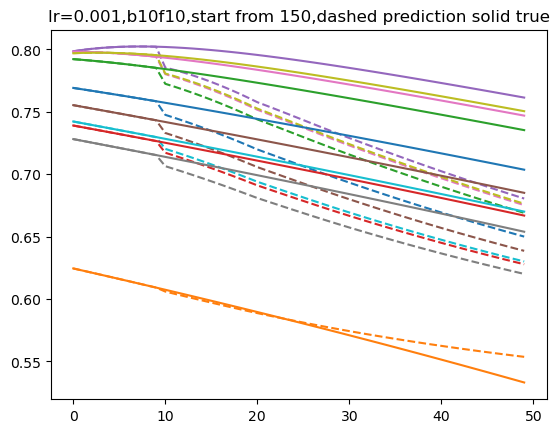

In [61]:
plt.plot(pred_traj[:50,0,:].detach(),'--',label='prediction')
plt.plot(state_uncontrolled[150:150+50,0,:],label='true')
plt.title('lr=0.001,b10f10,start from 150,dashed prediction solid true')
plt.show()

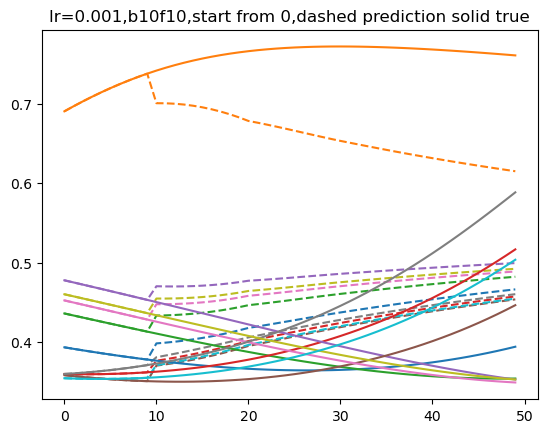

In [82]:
plt.plot(pred_traj[:50,0,:].detach(),'--',label='prediction')
plt.plot(state_uncontrolled[:50,0,:],label='true')
plt.title('lr=0.001,b10f10,start from 0,dashed prediction solid true')
plt.show()

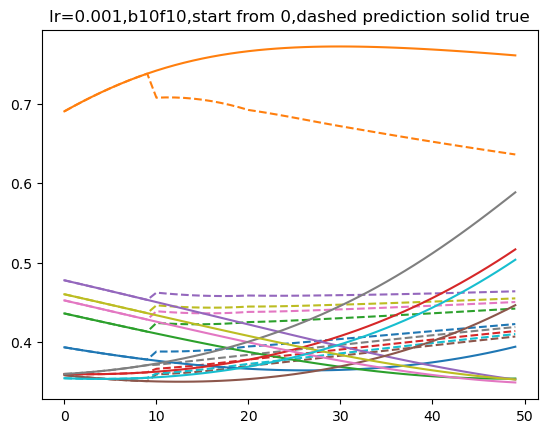

In [59]:
plt.plot(pred_traj[:50,0,:].detach(),'--',label='prediction')
plt.plot(state_uncontrolled[:50,0,:],label='true')
plt.title('lr=0.001,b10f10,start from 0,dashed prediction solid true')
plt.show()

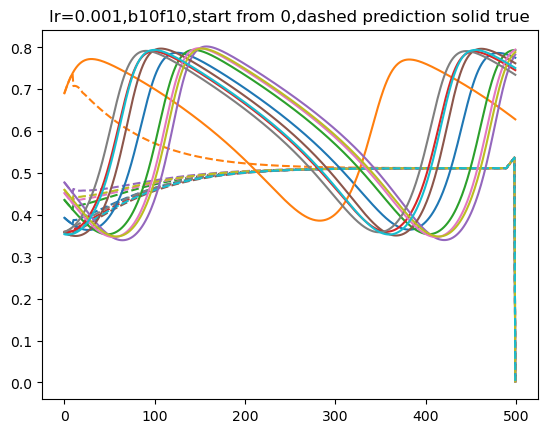

In [70]:
plt.plot(pred_traj[:500,0,:].detach(),'--',label='prediction')
plt.plot(state_uncontrolled[:500,0,:],label='true')
plt.title('lr=0.001,b10f10,start from 0,dashed prediction solid true')
plt.show()

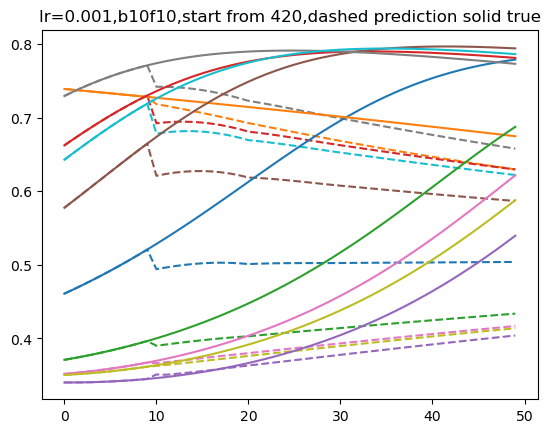

In [66]:
plt.plot(pred_traj[:50,0,:].detach(),'--',label='prediction')
plt.plot(state_uncontrolled[420:420+50,0,:],label='true')
plt.title('lr=0.001,b10f10,start from 420,dashed prediction solid true')
plt.show()

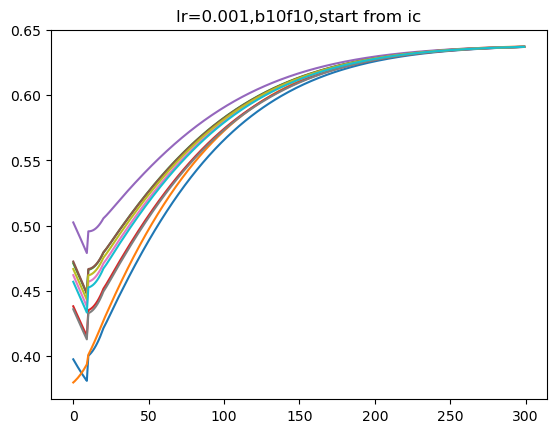

In [138]:
plt.plot(pred_traj[:300,0,:].detach())
plt.title('lr=0.001,b10f10,start from ic')
plt.show()

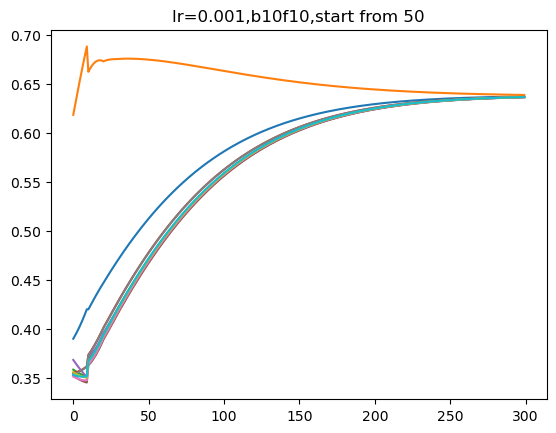

In [140]:
plt.plot(pred_traj[:300,0,:].detach())
plt.title('lr=0.001,b10f10,start from 50')
plt.show()

In [84]:
xx = state_uncontrolled[:look_back,:,:]
nocontrol_test = torch.zeros(look_back,10)
print(xx.shape,nocontrol_test.shape)

torch.Size([5, 2, 10]) torch.Size([5, 10])


In [126]:
model.eval()
data = state_uncontrolled.to(device)
pred_traj = torch.zeros(500,2,10)
pred_traj[:look_back,:,:] = state_uncontrolled[:look_back,:,:]
nocontrol_test = torch.zeros(look_back,n_nodes).unsqueeze(1) 
for i in range(500-(look_back+look_forward)):
    x = torch.cat((pred_traj[i:i+look_back,:,:], nocontrol_test), dim=1)
    pred = model(x.T,edge_index,edge_attr)[0]
    pred_traj[i+look_back:i+look_back+look_forward,:,:] = pred.T

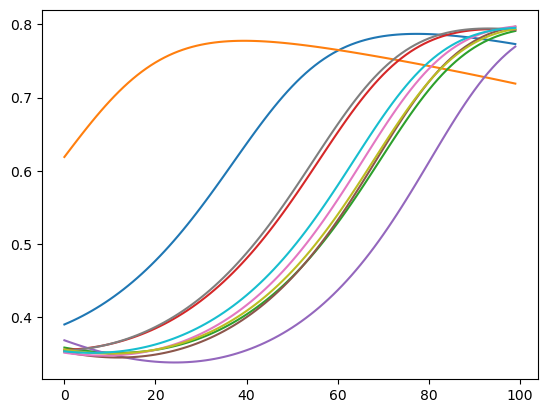

In [121]:
plt.plot(state_uncontrolled[50:150,0,:])
plt.show()

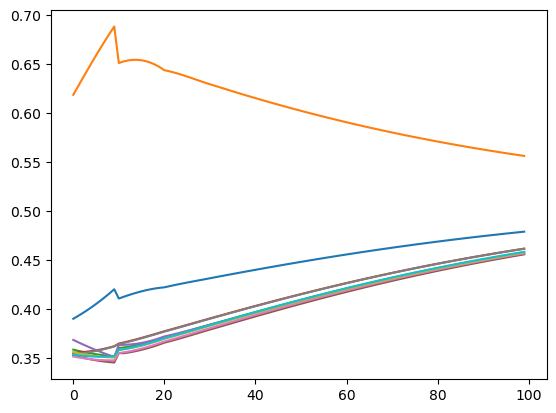

In [120]:
plt.plot(pred_traj[:100,0,:].detach())
plt.show()

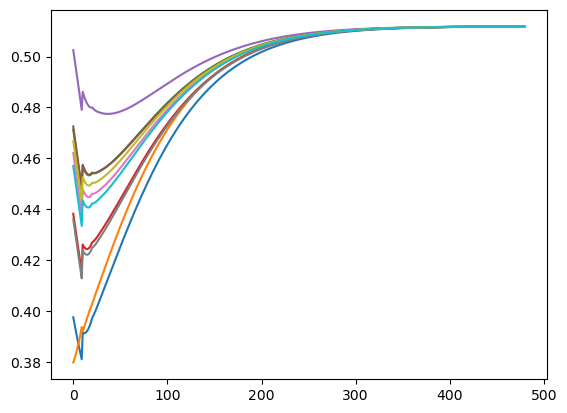

In [116]:
plt.plot(pred_traj[:480,0,:].detach())
plt.show()

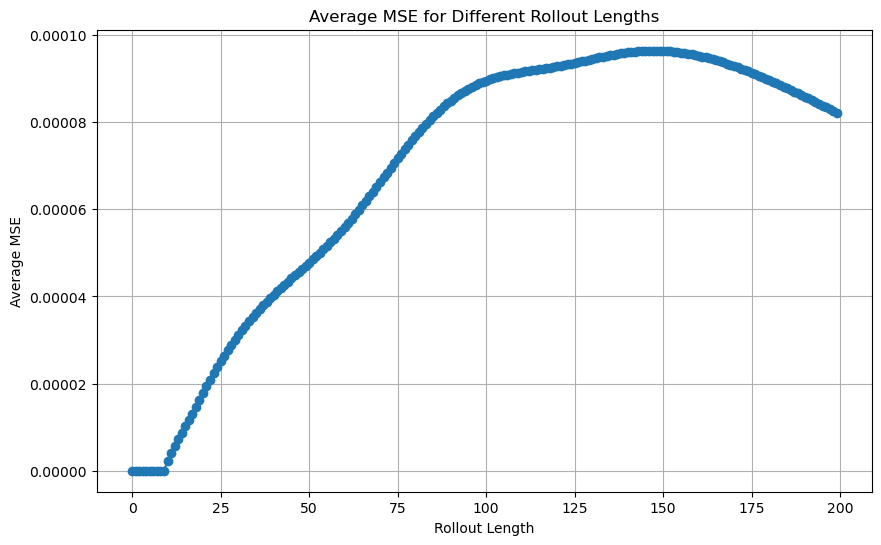

In [83]:
# Calculate MSE for each rollout length
ave_mse_values = []
loss_fn = nn.MSELoss()
for i in range(200):
    mse = loss_fn(data[:i+1,:,:], pred_traj[:i+1,:,:].detach())
    ave_mse = mse / (i+1)
    ave_mse_values.append(ave_mse)

# Now plot the results
plt.figure(figsize=(10, 6))
plt.plot(ave_mse_values, marker='o')
plt.title('Average MSE for Different Rollout Lengths')
plt.xlabel('Rollout Length')
plt.ylabel('Average MSE')
plt.grid(True)
plt.show()

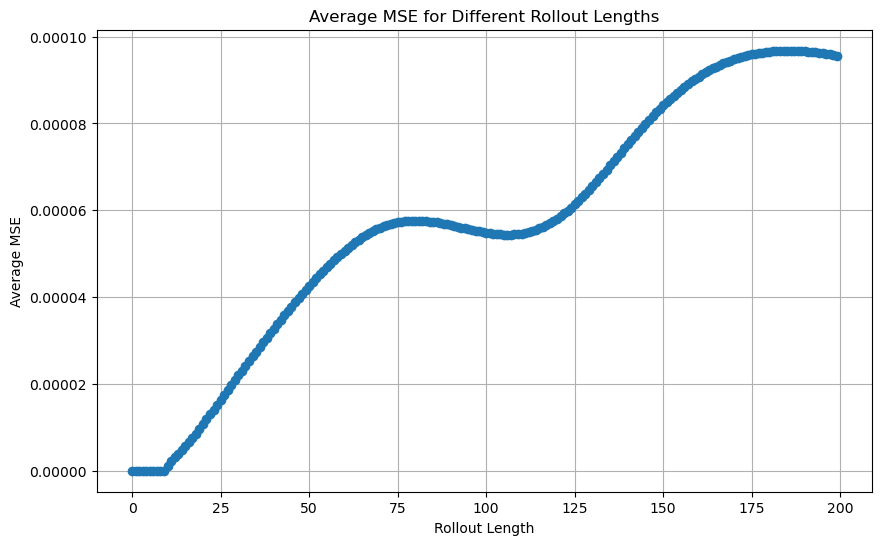

In [127]:
# Calculate MSE for each rollout length
ave_mse_values = []
loss_fn = nn.MSELoss()
for i in range(200):
    mse = loss_fn(data[:i+1,:,:], pred_traj[:i+1,:,:].detach())
    ave_mse = mse / (i+1)
    ave_mse_values.append(ave_mse)

# Now plot the results
plt.figure(figsize=(10, 6))
plt.plot(ave_mse_values, marker='o')
plt.title('Average MSE for Different Rollout Lengths')
plt.xlabel('Rollout Length')
plt.ylabel('Average MSE')
plt.grid(True)
plt.show()

In [108]:
torch.save(model.state_dict(), 'b10f10_l2_control_1008')

In [128]:
torch.save(model.state_dict(), 'b10f10_l2_control')

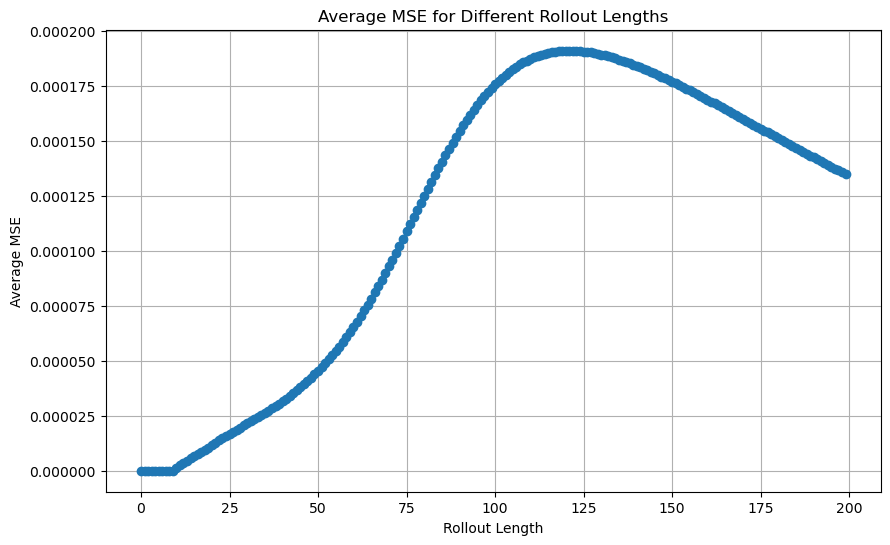

In [125]:
# Calculate MSE for each rollout length
ave_mse_values = []
loss_fn = nn.MSELoss()
for i in range(200):
    mse = loss_fn(data[50:50+i+1,:,:], pred_traj[:i+1,:,:].detach())
    ave_mse = mse / (i+1)
    ave_mse_values.append(ave_mse)

# Now plot the results
plt.figure(figsize=(10, 6))
plt.plot(ave_mse_values, marker='o')
plt.title('Average MSE for Different Rollout Lengths')
plt.xlabel('Rollout Length')
plt.ylabel('Average MSE')
plt.grid(True)
plt.show()

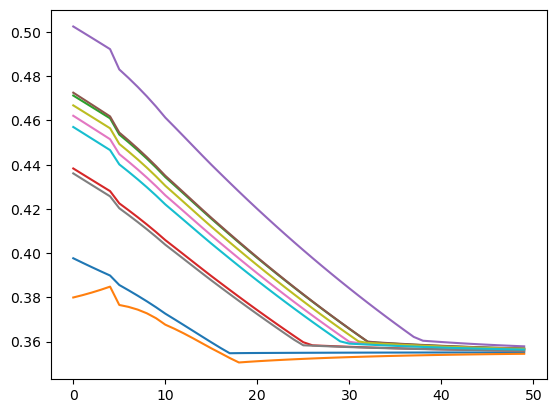

In [100]:
plt.plot(pred_traj[:50,0,:].detach())
plt.show()

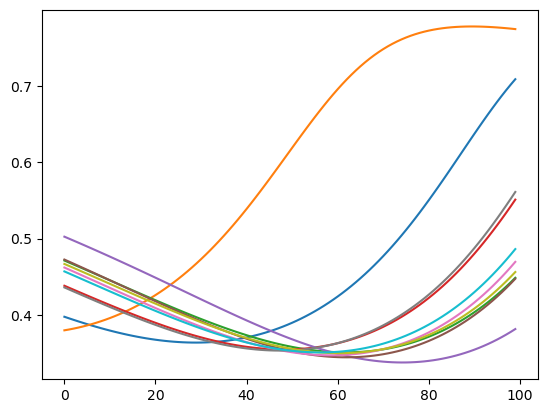

In [93]:
plt.plot(state_uncontrolled[:100,0,:].detach())
plt.show()

In [94]:
model.eval()
pred_traj = torch.zeros(100,2,10)
pred_traj[:look_back,:,:] = state_uncontrolled[60:60+look_back,:,:]
nocontrol_test = torch.zeros(look_back,n_nodes).unsqueeze(1) 
for i in range(100-(look_back+look_forward)):
    x = torch.cat((pred_traj[i:i+look_back,:,:], nocontrol_test), dim=1)
    pred = model(x.T,edge_index,edge_attr)[0]
    pred_traj[i+look_back:i+look_back+look_forward,:,:] = pred.T

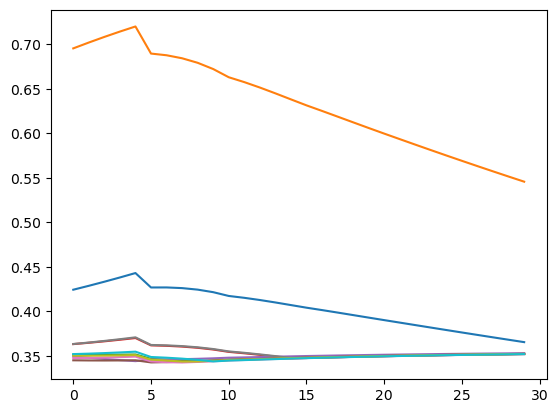

In [98]:
plt.plot(pred_traj[:30,0,:].detach())
plt.show()

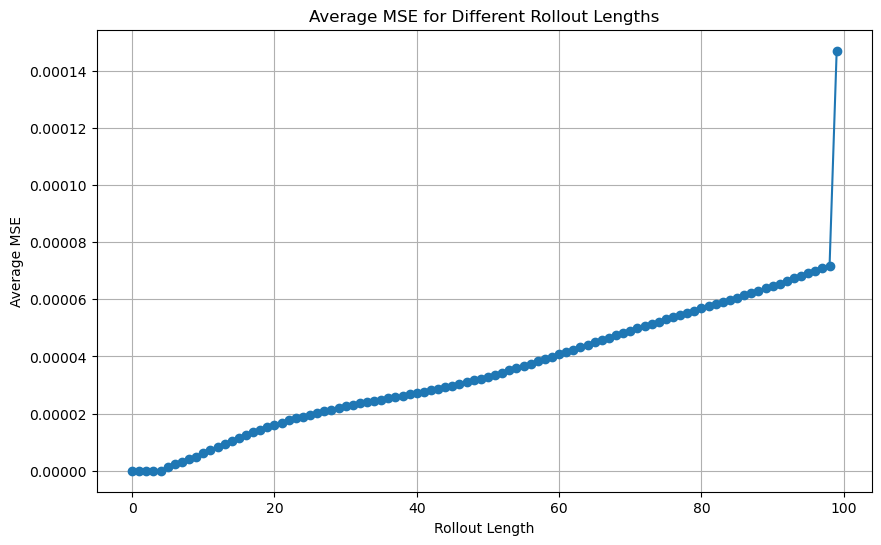

In [102]:
# Calculate MSE for each rollout length
ave_mse_values = []
loss_fn = nn.MSELoss()
for i in range(100):
    mse = loss_fn(data[:i+1,:,:], pred_traj[:i+1,:,:].detach())
    ave_mse = mse / (i+1)
    ave_mse_values.append(ave_mse)

# Now plot the results
plt.figure(figsize=(10, 6))
plt.plot(ave_mse_values, marker='o')
plt.title('Average MSE for Different Rollout Lengths')
plt.xlabel('Rollout Length')
plt.ylabel('Average MSE')
plt.grid(True)
plt.show()

In [11]:
look_back = 40 # the number of previous time steps to use as input variables to predict the next time period
look_forward = 20 # k steps ahead

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = MetaLayer(EdgeModel(), NodeModel()).to(device)
data = state_uncontrolled.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)
loss_fn = nn.MSELoss()
losses = []

model.train()
for epoch in range(100):
    loss_epoch = []
    for i in range(data.shape[0]-(look_back+look_forward)):
        x = data[i:i+look_back,:,:].T
        y = data[i+look_back:i+look_back+look_forward,:,:].T
        optimizer.zero_grad()
        out = model(x,edge_index,edge_attr)
        loss = loss_fn(out[0], y)
        loss.backward()
        optimizer.step()
        loss_epoch.append(loss.item())
    epoch_loss = sum(loss_epoch) / len(loss_epoch)
    losses.append(epoch_loss)

/var/folders/rr/j6h778k96l3cmvkjn2gmtjt40000gn/T/ipykernel_42878/2427618481.py:15: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/TensorShape.cpp:3575.)
  x = data[i:i+look_back,:,:].T


In [21]:
model.eval()
data = state_uncontrolled.to(device)
pred_traj = torch.zeros(data.shape[0],2,10)
pred_traj[:look_back,:,:] = data[:look_back,:,:]
for i in range(data.shape[0]-(look_back+look_forward)):
    x = pred_traj[i:i+look_back,:,:].T
    pred = model(x,edge_index,edge_attr)[0]
    pred_traj[i+look_back:i+look_back+look_forward,:,:] = pred.T

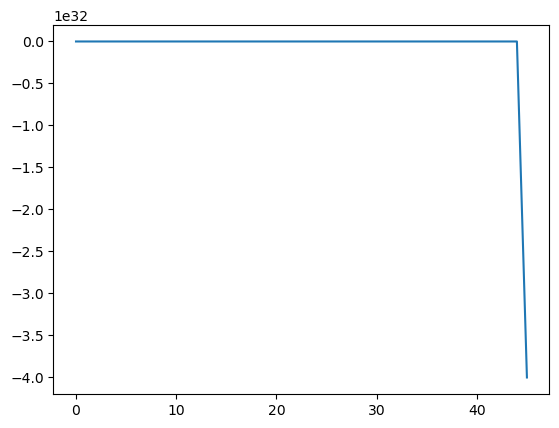

In [37]:
plt.plot(pred_traj[:50,0,6].detach())

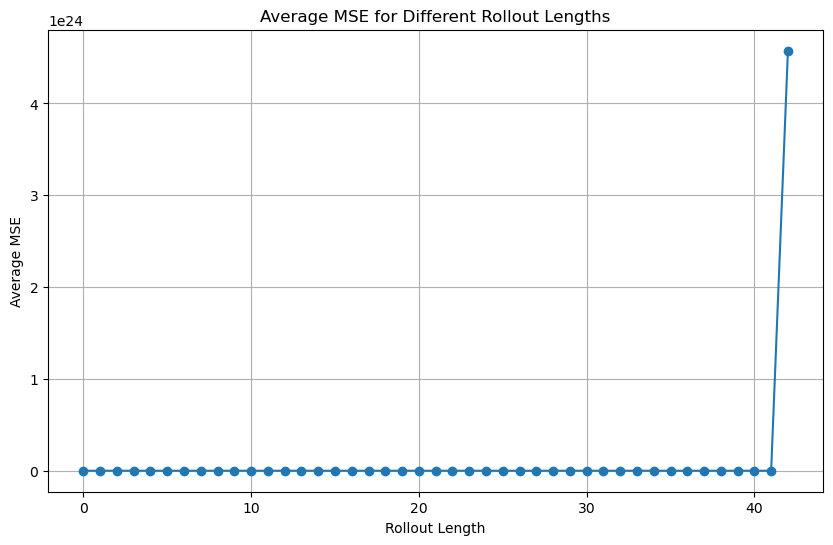

In [40]:
# Calculate MSE for each rollout length
ave_mse_values = []
loss_fn = nn.MSELoss()
for i in range(50):
    mse = loss_fn(data[:i+1,:,:], pred_traj[:i+1,:,:].detach())
    ave_mse = mse / (i+1)
    ave_mse_values.append(ave_mse)

# Now plot the results
plt.figure(figsize=(10, 6))
plt.plot(ave_mse_values, marker='o')
plt.title('Average MSE for Different Rollout Lengths')
plt.xlabel('Rollout Length')
plt.ylabel('Average MSE')
plt.grid(True)
plt.show()

In [208]:
def cross_correlation_matrix(x , tsteps , N):
    #if not isinstance(x, torch.Tensor):
        #x = torch.tensor(x, dtype=torch.float32, requires_grad=True)
    #elif not x.requires_grad:
        #x.requires_grad_(True)
    #x.retain_grad()
    means = (1/tsteps) * torch.sum(x, dim=0)
    stds = torch.sqrt(torch.sum((x - means)**2, dim=0))
    stdsgrid = torch.ones((N, 1)) * stds
    stdsgrid = stdsgrid.transpose(0, 1) * stdsgrid
    xcc = x - means
    cross_correlation_mat = torch.matmul(xcc.transpose(0, 1), xcc) / stdsgrid

    return cross_correlation_mat 

def f_sync_torch(control,tsteps , d , dt , N ,   I_p ,   I_e ,   I_s , alpha , beta, gamma, delta, epsilon, tau, mu ,sigma, A,  target_output ,node_ic,realizations,noise):
    adj = torch.ones(N,N)
    torch.diagonal(adj, 0).zero_()
    edge_index = adj.nonzero().t().contiguous()
    edge_attr = A[edge_index[0], edge_index[1]]
    
    control=control.view(tsteps,N)

    if not isinstance(control, torch.Tensor):
        control = torch.tensor(control, dtype=torch.float32, requires_grad=True)
    elif not control.requires_grad:
        control.requires_grad_(True)
    control.retain_grad()
    
    state = torch.zeros(tsteps,2,N)
    state[0,:,:] = node_ic
    for i in range(tsteps-1):
        x = state[i,:,:].T
        pred = model(x,edge_index,edge_attr)[0]
        state[i+1,:,:] = pred.T
    state = state[:,0,:]
    
    cc = cross_correlation_matrix(state , tsteps , N)
    f1 =   I_p * (1/4)* torch.sum((cc -   target_output)**2)
    f2=   I_e/2 * (control**2).sum() 
    if   I_s>1e-10:
        controlsum= torch.sum(control**2, dim=0)**(1.0 / 2.0)#
        f3 =   I_s  *torch.sum(controlsum)
    else:
        f3=0
    return (f1+f2+f3) 

def fprime_sync_torch(control,tsteps , d , dt , N , I_p , I_e , I_s , alpha , beta, gamma, delta, epsilon, tau, mu ,sigma, A,  target_output ,node_ic,realizations,noise):

    control=control.view(tsteps,N)
    if not isinstance(control, torch.Tensor):
        control = torch.tensor(control, dtype=torch.float32, requires_grad=True)
    elif not control.requires_grad:
        control.requires_grad_(True)
    control.retain_grad()
    # compute the function value
    y = f_sync_torch(control,tsteps , d , dt , N , I_p , I_e , I_s , alpha , beta, gamma, delta, epsilon, tau, mu ,sigma, A,  target_output ,node_ic,realizations,noise)
    # backward() computes the gradient and accumulates it in x.grad
    #torch.autograd.set_detect_anomaly(True)
    y.backward()

    return  control.grad.view(tsteps*N)

In [169]:
def cross_correlation_matrix(x , tsteps , N):
    if not isinstance(x, torch.Tensor):
        x = torch.tensor(x, dtype=torch.float32, requires_grad=True)
    elif not x.requires_grad:
        x.requires_grad_(True)
    x.retain_grad()
    means = (1/tsteps) * torch.sum(x, dim=0)
    stds = torch.sqrt(torch.sum((x - means)**2, dim=0))
    stdsgrid = torch.ones((N, 1)) * stds
    stdsgrid = stdsgrid.transpose(0, 1) * stdsgrid
    xcc = x - means
    cross_correlation_mat = torch.matmul(xcc.transpose(0, 1), xcc) / stdsgrid

    return cross_correlation_mat 

def f_sync_torch(control,tsteps , d , dt , N ,   I_p ,   I_e ,   I_s , alpha , beta, gamma, delta, epsilon, tau, mu ,sigma, A,  target_output ,node_ic,realizations,noise):
    adj = torch.ones(N,N)
    torch.diagonal(adj, 0).zero_()
    edge_index = adj.nonzero().t().contiguous()
    edge_attr = A[edge_index[0], edge_index[1]]
    
    control=control.view(tsteps,N)

    if not isinstance(control, torch.Tensor):
        control = torch.tensor(control, dtype=torch.float32, requires_grad=True)
    elif not control.requires_grad:
        control.requires_grad_(True)
    control.retain_grad()
    
    state = torch.zeros(tsteps,2,N)
    state[:look_back,:,:] = node_ic
    for i in range(tsteps-(look_back+look_forward)+1):
        x = torch.cat((state[i:i+look_back,:,:], control[i:i+look_back,:].unsqueeze(1)), dim=1)
        pred = model(x.T,edge_index,edge_attr)[0]
        state[i+look_back:i+look_back+look_forward,:,:] = pred.T
    state = state[:,0,:]

    cc = cross_correlation_matrix(state , tsteps , N)
    f1 =   I_p * (1/4)* torch.sum((cc -   target_output)**2)
    f2=   I_e/2 * (control**2).sum() 
    if   I_s>1e-10:
        controlsum= torch.sum(control**2, dim=0)**(1.0 / 2.0)#
        f3 =   I_s  *torch.sum(controlsum)
    else:
        f3=0
    return (f1+f2+f3) 

def fprime_sync_torch(control,tsteps , d , dt , N , I_p , I_e , I_s , alpha , beta, gamma, delta, epsilon, tau, mu ,sigma, A,  target_output ,node_ic,realizations,noise):

    control=control.view(tsteps,N)
    if not isinstance(control, torch.Tensor):
        control = torch.tensor(control, dtype=torch.float32, requires_grad=True)
    elif not control.requires_grad:
        control.requires_grad_(True)
    control.retain_grad()
    # compute the function value
    y = f_sync_torch(control,tsteps , d , dt , N , I_p , I_e , I_s , alpha , beta, gamma, delta, epsilon, tau, mu ,sigma, A,  target_output ,node_ic,realizations,noise)
    # backward() computes the gradient and accumulates it in x.grad
    #torch.autograd.set_detect_anomaly(True)
    y.backward(retain_graph=True)

    return  control.grad.view(tsteps*N)

In [163]:
for param in model.parameters():
    param.requires_grad = False

In [ ]:
#define the functional and its gradient
functional=f_sync_torch
gradient=fprime_sync_torch

control=-torch.ones((tsteps,parameters['N']))*0.002
control=control.reshape(tsteps*parameters['N'])
#initialize the control loop
#warnflag=1-> running, warnflag=0->finished, warnflag=3->error
warnflag=1
#start the optmization
result = FR_algorithm(functional, control, gradient, max_k=1000, **args)
control=result[0]
warnflag=result[2]
iteration+=result[4]
print('Code finished after ',iteration,' iterations with warnflag',result[2])

In [195]:
# Closed-loop controller using shorter rollouts
# node_ic is k-steps long
def closed_loop_controller(rollout_length, functional, control, gradient, max_k=1000, **args):
    tsteps = args['tsteps'] #timesteps, int
    dt = args['dt'] #stepsize of timesteps, float
    N = args['N'] #number of nodes, int
    d = args['d'] #dimension of oscillator dynamnode_ics, int
    target_output = args['target_output'] #desired/target state, array shape(tsteps,N)
    node_ic= args['node_ic'] #initial conditions of the network dynamnode_ics, array shape(d,N),

    # Calculate the total number of rollouts
    num_rollouts = int(tsteps / rollout_length)
    # Set the time horizon for the current rollout
    args['tsteps'] = rollout_length

    current_state = node_ic
    total_control = []
    total_controlled_traj = []

    for rollout in range(num_rollouts):
        iteration=0 
        
        # 3. Run the FR_algorithm for the current rollout
        result = FR_algorithm(functional, control, gradient, max_k=1000, **args)
        iteration+=result[4]
        print('Rollout',rollout,'Code finished after ',iteration,' iterations with warnflag',result[2])
        control_rollout=result[0].reshape(rollout_length,N)
        #print(control_rollout.grad)
        total_control.append(control_rollout.detach())

        # 4. Propagate the system with the optimized control to get the new state

        pred_traj = torch.zeros(rollout_length,2,N)
        pred_traj[:look_back,:,:] = node_ic
        #print(control_rollout.shape)
        control_expanded = control_rollout.unsqueeze(1)
        #print(control_expanded.shape)
        for i in range(rollout_length-(look_back+look_forward)+1):
            x = torch.cat((pred_traj[i:i+look_back,:,:], control_expanded[i:i+look_back,:,:]), dim=1)
            pred = model(x.T,edge_index,edge_attr)[0]
            pred_traj[i+look_back:i+look_back+look_forward,:,:] = pred.T
            
        total_controlled_traj.append(pred_traj)
        args['node_ic'] = pred[-look_back:,:,:]
    
        # This can be a simulation of your system using the optimized control for the current rollout. 
        # Depending on your problem, you might already have such a function or you might need to write one.

    return total_control, total_controlled_traj

In [170]:
for param in model.parameters():
    param.requires_grad = False
functional=f_sync_torch
gradient=fprime_sync_torch

rollout_length = 30
control=-torch.ones((rollout_length,parameters['N']))*0.01#02
control=control.reshape(rollout_length*parameters['N'])
iteration = 0
args['node_ic']=state_uncontrolled[:look_back,:,:]
total_control, total_controlled_traj = closed_loop_controller(rollout_length, functional, control, gradient, max_k=1000, **args)

tensor([0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100,
        0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100,
        0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100,
        0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0101, 0.0100,
        0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0101,
        0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100,
        0.0101, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100,
        0.0100, 0.0101, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100,
        0.0100, 0.0100, 0.0101, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100,
        0.0100, 0.0100, 0.0100, 0.0102, 0.0100, 0.0100, 0.0100, 0.0100, 0.0100,
        0.0100, 0.0100, 0.0100, 0.0100, 0.0102, 0.0101, 0.0100, 0.0100, 0.0100,
        0.0100, 0.0100, 0.0101, 0.0101, 0.0100, 0.0102, 0.0101, 0.0100, 0.0100,
        0.0101, 0.0100, 0.0100, 0.0100, 

tensor([-0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018,
        -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018,
        -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018,
        -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018,
        -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018,
        -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018,
        -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018,
        -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018,
        -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018,
        -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018,
        -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018,
        -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018,
        -0.0018, -0.0018, -0.0018, -0.00

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

tensor([0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032, 0.0032,
        0.0032, 0.0032, 0.0032, 0.0032, 

## MPC

In [25]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = MetaLayer(EdgeModel(), NodeModel()).to(device)
model.load_state_dict(torch.load('b10f10_l2_control'))

<All keys matched successfully>

In [26]:
def cross_correlation_matrix(x , tsteps , N):
    #if not isinstance(x, torch.Tensor):
        #x = torch.tensor(x, dtype=torch.float32, requires_grad=True)
    #elif not x.requires_grad:
        #x.requires_grad_(True)
    #x.retain_grad()
    means = (1/tsteps) * torch.sum(x, dim=0)
    stds = torch.sqrt(torch.sum((x - means)**2, dim=0))
    stdsgrid = torch.ones((N, 1)) * stds
    stdsgrid = stdsgrid.transpose(0, 1) * stdsgrid
    xcc = x - means
    cross_correlation_mat = torch.matmul(xcc.transpose(0, 1), xcc) / stdsgrid

    return cross_correlation_mat 

def sync_loss(control,tsteps , d , dt , N ,   I_p ,   I_e ,   I_s ,A,target_output ,node_ic):
    adj = torch.ones(N,N)
    torch.diagonal(adj, 0).zero_()
    edge_index = adj.nonzero().t().contiguous()
    edge_attr = A[edge_index[0], edge_index[1]]
    
    control=control.reshape(tsteps,N)

    #if not isinstance(control, torch.Tensor):
        #control = torch.tensor(control, dtype=torch.float32, requires_grad=True)
    #elif not control.requires_grad:
        #control.requires_grad_(True)
    control.retain_grad()

    state = torch.zeros(tsteps,2,N)
    state[:look_back,:,:] = node_ic
    for i in range(tsteps-(look_back+look_forward)+1):
        x = torch.cat((state[i:i+look_back,:,:], control[i:i+look_back,:].unsqueeze(1)), dim=1)
        pred = model(x.T,edge_index,edge_attr)[0]
        state[i+look_back:i+look_back+look_forward,:,:] = pred.T
    state = state[:,0,:]

    cc = cross_correlation_matrix(state , tsteps , N)
    f1 =   I_p * (1/4)* torch.sum((cc -   target_output)**2)
    f2=   I_e/2 * (control**2).sum() 
    if   I_s>1e-10:
        controlsum= torch.sum(control**2, dim=0)**(1.0 / 2.0)#
        f3 =   I_s  *torch.sum(controlsum)
    else:
        f3=0
    return (f1+f2+f3) 

In [96]:
# node_ic is k-steps long
def MPC_controller(rollout_length, num_control_epochs=15,max_k=1000, **args):
    tsteps = args['tsteps'] #timesteps, int
    dt = args['dt'] #stepsize of timesteps, float
    N = args['N'] #number of nodes, int
    d = args['d'] #dimension of oscillator dynamnode_ics, int
    target_output = args['target_output'] #desired/target state, array shape(tsteps,N)
    node_ic= args['node_ic'] #initial conditions of the network dynamnode_ics, array shape(d,N),

    # Calculate the total number of rollouts
    num_rollouts = int(tsteps / rollout_length)
    # Set the time horizon for the current rollout
    args['tsteps'] = rollout_length

    current_state = node_ic
    total_control = []
    total_controlled_traj = []

    for rollout in range(num_rollouts):
        control = torch.ones(rollout_length*N, requires_grad=True)
        control.data *= -0.002
        #print(control.is_leaf)
        optimizer = torch.optim.Adam([control], lr=0.01)
        for epoch in range(num_control_epochs):
            optimizer.zero_grad()
            loss = sync_loss(control,rollout_length , d , dt , N ,   I_p ,   I_e ,   I_s ,A,target_output ,node_ic)
            loss.backward(retain_graph=True)
            if epoch >= num_control_epochs - 3:  
                print(f"Epoch {epoch}: {control}")
            optimizer.step()
            if epoch >= num_control_epochs - 3:  
                print(f"Epoch {epoch}: {control}")
        print(control)
        control = control.detach().reshape(rollout_length,N)
        total_control.append(control)
        # 4. Propagate the system with the optimized control to get the new state
        pred_traj = torch.zeros(rollout_length,2,N)
        pred_traj[:look_back,:,:] = node_ic
        #print(control_rollout.shape)
        control_expanded = control.unsqueeze(1)
        #print(control_expanded.shape)
        for i in range(rollout_length-(look_back+look_forward)+1):
            x = torch.cat((pred_traj[i:i+look_back,:,:], control_expanded[i:i+look_back,:,:]), dim=1)
            pred = model(x.T,edge_index,edge_attr)[0]
            pred_traj[i+look_back:i+look_back+look_forward,:,:] = pred.T
            
        total_controlled_traj.append(pred_traj)
        node_ic = pred_traj[-look_back:,:,:]
    
        # This can be a simulation of your system using the optimized control for the current rollout. 
        # Depending on your problem, you might already have such a function or you might need to write one.

    return total_control, total_controlled_traj

In [101]:
total_control5, total_controlled_traj5 = MPC_controller(rollout_length=30,**args)

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0013, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0013, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0014,
        -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014,
        -0.0013, -0.0014, -0.0013, -0.0014, -0.0013, -0.0014, -0.0014, -0.0013,
        -0.0014, -0.0014, -0.0012, -0.0014, -0.0013, -0.0014, -0.0013, -0.0014,
        -0.0014, -0.0013, -0.0013, -0.0014, -0.0012, -0.0014, -0.0013, -0.0014,
        -0.0013, -0.0014, -0.0014, -0.0013, -0.0013, -0.0014, -0.0011, -0.0014,
        -0.0013, -0.0014, -0.0

Epoch 12: tensor([-1.3860e-03, -1.3871e-03, -1.3843e-03, -1.3864e-03, -1.3848e-03,
        -1.3865e-03, -1.3830e-03, -1.3864e-03, -1.3824e-03, -1.3865e-03,
        -1.3826e-03, -1.3850e-03, -1.3772e-03, -1.3840e-03, -1.3756e-03,
        -1.3840e-03, -1.3727e-03, -1.3840e-03, -1.3706e-03, -1.3841e-03,
        -1.3769e-03, -1.3816e-03, -1.3646e-03, -1.3800e-03, -1.3555e-03,
        -1.3801e-03, -1.3545e-03, -1.3800e-03, -1.3492e-03, -1.3803e-03,
        -1.3697e-03, -1.3788e-03, -1.3483e-03, -1.3752e-03, -1.3245e-03,
        -1.3755e-03, -1.3302e-03, -1.3751e-03, -1.3203e-03, -1.3758e-03,
        -1.3619e-03, -1.3780e-03, -1.3298e-03, -1.3702e-03, -1.2855e-03,
        -1.3706e-03, -1.3021e-03, -1.3701e-03, -1.2867e-03, -1.3710e-03,
        -1.3519e-03, -1.3769e-03, -1.3051e-03, -1.3639e-03, -1.2298e-03,
        -1.3645e-03, -1.2645e-03, -1.3637e-03, -1.2411e-03, -1.3651e-03,
        -1.3399e-03, -1.3758e-03, -1.2749e-03, -1.3566e-03, -1.1580e-03,
        -1.3574e-03, -1.2181e-03, -1.3564

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0015, -0.0013, -0.0013,
        -0.0014, -0.0013, -0.0013, -0.0013, -0.0013, -0.0013, -0.0013, -0.0016,
        -0.0013, -0.0013, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0013, -0.0017, -0.0012, -0.0013, -0.0014, -0.0013, -0.0012, -0.0013,
        -0.0012, -0.0013, -0.0012, -0.0018, -0.0011, -0.0013, -0.0013, -0.0013,
        -0.0011, -0.0013, -0.0011, -0.0013, -0.0012, -0.0018, -0.0011, -0.0012,
        -0.0013, -0.0012, -0.0010, -0.0012, -0.0010, -0.0012, -0.0011, -0.0018,
        -0.0010, -0.0012, -0.0012, -0.0012, -0.0009, -0.0012, -0.0009, -0.0012,
        -0.0011, -0.0018, -0.0009, -0.0012, -0.0011, -0.0012, -0.0008, -0.0012,
        -0.0008, -0.0012, -0.0010, -0.0018, -0.0007, -0.0011, -0.0010, -0.0011,
        -0.0006, -0.0011, -0.0

Epoch 12: tensor([-0.0014, -0.0011, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0006, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,  0.0004, -0.0014, -0.0014,
        -0.0013, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,  0.0018,
        -0.0014, -0.0014, -0.0013, -0.0014, -0.0013, -0.0014, -0.0013, -0.0014,
        -0.0013,  0.0036, -0.0014, -0.0013, -0.0012, -0.0013, -0.0012, -0.0013,
        -0.0012, -0.0013, -0.0013,  0.0059, -0.0013, -0.0013, -0.0010, -0.0013,
        -0.0011, -0.0013, -0.0011, -0.0013, -0.0012,  0.0086, -0.0012, -0.0012,
        -0.0009, -0.0012, -0.0009, -0.0012, -0.0009, -0.0013, -0.0012,  0.0111,
        -0.0012, -0.0012, -0.0007, -0.0012, -0.0008, -0.0012, -0.0008, -0.0012,
        -0.0011,  0.0140, -0.0011, -0.0011, -0.0005, -0.0011, -0.0006, -0.0011,
        -0.0006, -0.0012, -0.0010,  0.0171, -0.0009, -0.0011, -0.0033, -0.0011,
        -0.0034, -0.0011, -0.0

Epoch 12: tensor([-0.0014, -0.0017, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0020, -0.0015, -0.0014, -0.0015, -0.0014,
        -0.0015, -0.0014, -0.0015, -0.0014, -0.0015, -0.0021, -0.0015, -0.0015,
        -0.0015, -0.0015, -0.0016, -0.0015, -0.0016, -0.0015, -0.0015, -0.0016,
        -0.0016, -0.0015, -0.0016, -0.0015, -0.0016, -0.0015, -0.0017, -0.0015,
        -0.0016, -0.0004, -0.0016, -0.0015, -0.0016, -0.0015, -0.0017, -0.0015,
        -0.0018, -0.0015, -0.0016,  0.0015, -0.0016, -0.0015, -0.0017, -0.0015,
        -0.0017, -0.0015, -0.0019, -0.0015, -0.0016,  0.0036, -0.0015, -0.0015,
        -0.0017, -0.0015, -0.0017, -0.0015, -0.0020, -0.0015, -0.0016,  0.0049,
        -0.0015, -0.0015, -0.0017, -0.0015, -0.0017, -0.0015, -0.0021, -0.0015,
        -0.0015,  0.0059, -0.0014, -0.0014, -0.0017, -0.0014, -0.0047, -0.0014,
        -0.0051, -0.0014, -0.0014,  0.0065, -0.0044, -0.0014, -0.0050, -0.0013,
        -0.0048, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0015, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0015, -0.0015, -0.0015, -0.0016, -0.0015,
        -0.0015, -0.0015, -0.0015, -0.0015, -0.0015, -0.0008, -0.0016, -0.0015,
        -0.0017, -0.0015, -0.0015, -0.0015, -0.0015, -0.0015, -0.0015,  0.0008,
        -0.0016, -0.0015, -0.0019, -0.0015, -0.0016, -0.0015, -0.0016, -0.0015,
        -0.0015,  0.0028, -0.0017, -0.0015, -0.0020, -0.0015, -0.0017, -0.0015,
        -0.0016, -0.0015, -0.0015,  0.0047, -0.0017, -0.0015, -0.0021, -0.0015,
        -0.0017, -0.0015, -0.0016, -0.0015, -0.0015,  0.0058, -0.0017, -0.0015,
        -0.0022, -0.0015, -0.0018, -0.0015, -0.0016, -0.0015, -0.0014,  0.0057,
        -0.0017, -0.0014, -0.0023, -0.0014, -0.0018, -0.0014, -0.0016, -0.0014,
        -0.0044,  0.0056, -0.0048, -0.0013, -0.0024, -0.0013, -0.0050, -0.0013,
        -0.0016, -0.0013, -0.0043,  0.0069, -0.0048, -0.0043, -0.0024, -0.0043,
        -0.0051, -0.0043, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0017, -0.0014,
        -0.0015, -0.0014, -0.0016, -0.0014, -0.0015, -0.0008, -0.0015, -0.0015,
        -0.0019, -0.0015, -0.0016, -0.0015, -0.0018, -0.0015, -0.0015,  0.0002,
        -0.0016, -0.0015, -0.0021, -0.0015, -0.0017, -0.0015, -0.0020, -0.0015,
        -0.0015,  0.0013, -0.0016, -0.0015, -0.0024, -0.0014, -0.0017, -0.0015,
        -0.0022, -0.0014, -0.0015,  0.0022, -0.0016, -0.0014, -0.0026, -0.0014,
        -0.0018, -0.0014, -0.0024, -0.0014, -0.0015,  0.0028, -0.0016, -0.0013,
        -0.0029, -0.0013, -0.0018, -0.0013, -0.0026, -0.0013, -0.0014,  0.0035,
        -0.0016, -0.0013, -0.0030, -0.0012, -0.0018, -0.0013, -0.0027, -0.0012,
        -0.0044,  0.0057, -0.0018, -0.0041, -0.0032, -0.0041, -0.0019, -0.0041,
        -0.0028, -0.0041, -0.0044,  0.0090, -0.0049, -0.0040, -0.0034, -0.0040,
        -0.0019, -0.0041, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0015, -0.0014,
        -0.0015, -0.0014, -0.0015, -0.0014, -0.0015, -0.0015, -0.0016, -0.0015,
        -0.0016, -0.0015, -0.0016, -0.0015, -0.0016, -0.0012, -0.0017, -0.0015,
        -0.0018, -0.0015, -0.0018, -0.0015, -0.0018, -0.0015, -0.0016, -0.0007,
        -0.0018, -0.0016, -0.0020, -0.0016, -0.0021, -0.0016, -0.0021, -0.0016,
        -0.0017,  0.0001, -0.0019, -0.0016, -0.0023, -0.0016, -0.0023, -0.0016,
        -0.0023, -0.0016, -0.0017,  0.0019, -0.0020, -0.0017, -0.0025, -0.0017,
        -0.0025, -0.0017, -0.0025, -0.0017, -0.0018,  0.0049, -0.0021, -0.0017,
        -0.0027, -0.0017, -0.0027, -0.0017, -0.0027, -0.0017, -0.0018,  0.0073,
        -0.0022, -0.0017, -0.0029, -0.0017, -0.0029, -0.0017, -0.0029, -0.0017,
        -0.0018,  0.0094, -0.0023, -0.0049, -0.0032, -0.0048, -0.0031, -0.0049,
        -0.0031, -0.0048, -0.0053,  0.0103, -0.0024, -0.0050, -0.0034, -0.0049,
        -0.0034, -0.0050, -0.0

Epoch 12: tensor([-0.0015, -0.0015, -0.0015, -0.0015, -0.0015, -0.0015, -0.0015, -0.0015,
        -0.0015, -0.0015, -0.0016, -0.0015, -0.0016, -0.0016, -0.0016, -0.0016,
        -0.0016, -0.0016, -0.0016, -0.0016, -0.0019, -0.0012, -0.0018, -0.0017,
        -0.0018, -0.0017, -0.0018, -0.0017, -0.0018, -0.0017, -0.0021, -0.0003,
        -0.0021, -0.0019, -0.0021, -0.0019, -0.0021, -0.0019, -0.0021, -0.0019,
        -0.0024,  0.0021, -0.0023, -0.0020, -0.0023, -0.0020, -0.0023, -0.0020,
        -0.0023, -0.0020, -0.0027,  0.0063, -0.0026, -0.0022, -0.0026, -0.0022,
        -0.0026, -0.0022, -0.0026, -0.0022, -0.0030,  0.0086, -0.0029, -0.0024,
        -0.0028, -0.0024, -0.0029, -0.0024, -0.0029, -0.0024, -0.0032,  0.0078,
        -0.0031, -0.0025, -0.0031, -0.0025, -0.0031, -0.0025, -0.0031, -0.0025,
        -0.0035,  0.0059, -0.0034, -0.0026, -0.0034, -0.0026, -0.0034, -0.0026,
        -0.0034, -0.0026, -0.0038,  0.0045, -0.0037, -0.0028, -0.0037, -0.0028,
        -0.0037, -0.0028, -0.0

Epoch 12: tensor([-0.0015, -0.0015, -0.0015, -0.0015, -0.0015, -0.0015, -0.0015, -0.0015,
        -0.0015, -0.0015, -0.0016, -0.0016, -0.0016, -0.0016, -0.0016, -0.0016,
        -0.0016, -0.0016, -0.0016, -0.0016, -0.0019, -0.0014, -0.0018, -0.0019,
        -0.0018, -0.0019, -0.0018, -0.0019, -0.0018, -0.0019, -0.0021, -0.0004,
        -0.0020, -0.0021, -0.0020, -0.0021, -0.0020, -0.0021, -0.0020, -0.0021,
        -0.0024,  0.0025, -0.0023, -0.0024, -0.0022, -0.0024, -0.0022, -0.0024,
        -0.0022, -0.0024, -0.0026,  0.0075, -0.0025, -0.0027, -0.0025, -0.0027,
        -0.0025, -0.0027, -0.0025, -0.0027, -0.0029,  0.0077, -0.0028, -0.0030,
        -0.0028, -0.0030, -0.0028, -0.0030, -0.0028, -0.0030, -0.0032,  0.0052,
        -0.0031, -0.0032, -0.0030, -0.0033, -0.0030, -0.0032, -0.0030, -0.0033,
        -0.0035,  0.0031, -0.0033, -0.0036, -0.0033, -0.0036, -0.0033, -0.0036,
        -0.0033, -0.0036, -0.0039,  0.0020, -0.0037, -0.0039, -0.0036, -0.0040,
        -0.0036, -0.0039, -0.0

Epoch 12: tensor([-0.0015, -0.0015, -0.0014, -0.0015, -0.0014, -0.0015, -0.0014, -0.0015,
        -0.0014, -0.0015, -0.0016, -0.0015, -0.0016, -0.0016, -0.0016, -0.0016,
        -0.0016, -0.0016, -0.0016, -0.0016, -0.0018, -0.0014, -0.0017, -0.0018,
        -0.0017, -0.0018, -0.0017, -0.0018, -0.0017, -0.0018, -0.0020, -0.0008,
        -0.0019, -0.0020, -0.0019, -0.0020, -0.0019, -0.0020, -0.0019, -0.0020,
        -0.0022,  0.0008, -0.0021, -0.0022, -0.0021, -0.0022, -0.0021, -0.0022,
        -0.0021, -0.0022, -0.0024,  0.0048, -0.0023, -0.0025, -0.0023, -0.0025,
        -0.0023, -0.0025, -0.0023, -0.0025, -0.0027,  0.0086, -0.0026, -0.0027,
        -0.0026, -0.0027, -0.0026, -0.0027, -0.0026, -0.0027, -0.0029,  0.0082,
        -0.0028, -0.0029, -0.0028, -0.0030, -0.0028, -0.0029, -0.0028, -0.0030,
        -0.0032,  0.0055, -0.0030, -0.0032, -0.0030, -0.0032, -0.0030, -0.0032,
        -0.0030, -0.0032, -0.0035,  0.0033, -0.0033, -0.0035, -0.0033, -0.0036,
        -0.0033, -0.0035, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0015, -0.0015, -0.0015, -0.0015,
        -0.0015, -0.0015, -0.0015, -0.0015, -0.0017, -0.0013, -0.0016, -0.0017,
        -0.0016, -0.0017, -0.0016, -0.0017, -0.0016, -0.0017, -0.0018, -0.0010,
        -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018, -0.0018,
        -0.0020, -0.0001, -0.0019, -0.0020, -0.0019, -0.0020, -0.0019, -0.0020,
        -0.0019, -0.0020, -0.0022,  0.0020, -0.0021, -0.0022, -0.0021, -0.0022,
        -0.0021, -0.0022, -0.0021, -0.0022, -0.0024,  0.0060, -0.0023, -0.0024,
        -0.0023, -0.0024, -0.0023, -0.0024, -0.0023, -0.0024, -0.0025,  0.0087,
        -0.0025, -0.0025, -0.0024, -0.0026, -0.0024, -0.0025, -0.0024, -0.0026,
        -0.0027,  0.0090, -0.0026, -0.0028, -0.0026, -0.0028, -0.0026, -0.0027,
        -0.0026, -0.0028, -0.0030,  0.0065, -0.0029, -0.0030, -0.0028, -0.0030,
        -0.0029, -0.0030, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0015, -0.0015, -0.0015, -0.0015,
        -0.0015, -0.0015, -0.0015, -0.0015, -0.0015, -0.0013, -0.0015, -0.0015,
        -0.0015, -0.0015, -0.0015, -0.0015, -0.0015, -0.0015, -0.0016, -0.0011,
        -0.0016, -0.0016, -0.0016, -0.0016, -0.0016, -0.0016, -0.0016, -0.0016,
        -0.0017, -0.0007, -0.0017, -0.0017, -0.0017, -0.0017, -0.0017, -0.0017,
        -0.0017, -0.0017, -0.0018,  0.0003, -0.0018, -0.0018, -0.0018, -0.0018,
        -0.0018, -0.0018, -0.0018, -0.0018, -0.0019,  0.0024, -0.0019, -0.0019,
        -0.0019, -0.0019, -0.0019, -0.0019, -0.0019, -0.0019, -0.0020,  0.0050,
        -0.0019, -0.0020, -0.0019, -0.0020, -0.0019, -0.0020, -0.0019, -0.0020,
        -0.0021,  0.0082, -0.0020, -0.0021, -0.0020, -0.0021, -0.0020, -0.0021,
        -0.0020, -0.0021, -0.0022,  0.0099, -0.0022, -0.0022, -0.0021, -0.0022,
        -0.0022, -0.0022, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0016, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0016,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0016, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0012, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0007,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014,  0.0004, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014,  0.0022, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0012,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0012, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0011, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0010, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0009,
        -0.0014, -0.0015, -0.0014, -0.0015, -0.0014, -0.0015, -0.0014, -0.0015,
        -0.0015, -0.0008, -0.0015, -0.0015, -0.0015, -0.0015, -0.0015, -0.0015,
        -0.0015, -0.0015, -0.0015, -0.0007, -0.0015, -0.0015, -0.0015, -0.0015,
        -0.0015, -0.0015, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0012, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0012, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0011, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0011,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0010, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0010, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0013, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0012,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0012, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0012, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0013, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

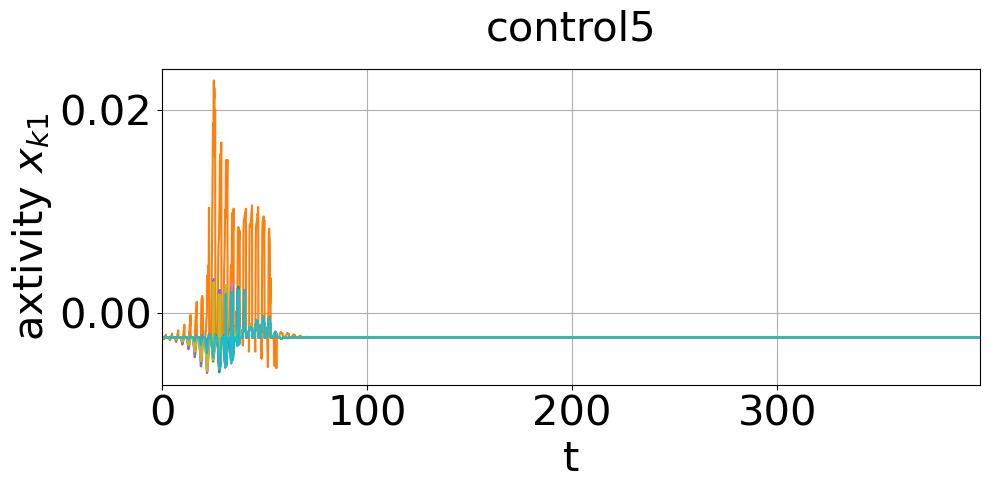

In [105]:
tensor_control5 = torch.cat(total_control5, dim=0)
create_plot(tensor_control5,'axtivity $x_{k1}$','control5')
plt.show()

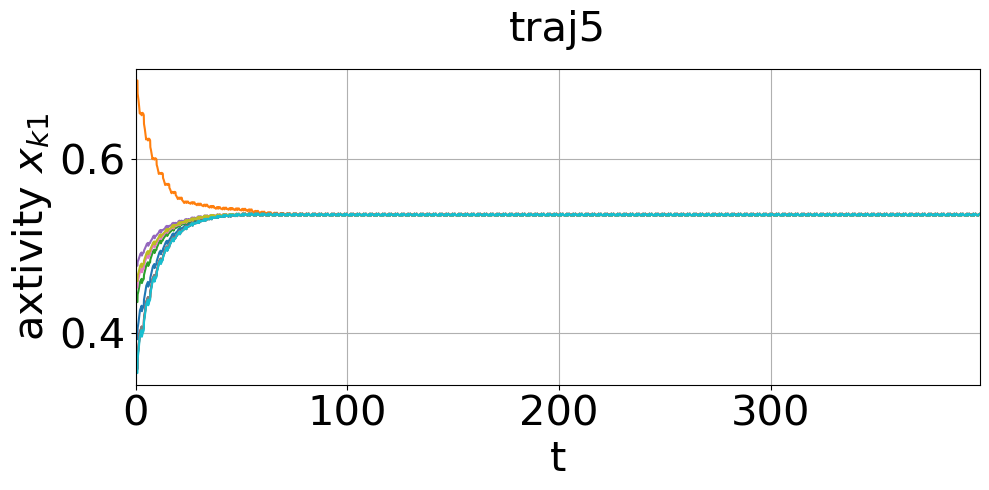

In [107]:
tensor_traj5 = torch.cat(total_controlled_traj5, dim=0)
create_plot(tensor_traj5[:,0,:].detach(),'axtivity $x_{k1}$','traj5')
plt.show()

In [97]:
total_control4, total_controlled_traj4 = MPC_controller(rollout_length=50,**args)

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-1.3865e-03, -1.3840e-03, -1.3858e-03, -1.3868e-03, -1.3874e-03,
        -1.3868e-03, -1.3853e-03, -1.3868e-03, -1.3851e-03, -1.3868e-03,
        -1.3842e-03, -1.3769e-03, -1.3818e-03, -1.3850e-03, -1.3854e-03,
        -1.3851e-03, -1.3799e-03, -1.3850e-03, -1.3792e-03, -1.3851e-03,
        -1.3806e-03, -1.3659e-03, -1.3751e-03, -1.3822e-03, -1.3808e-03,
        -1.3823e-03, -1.3708e-03, -1.3822e-03, -1.3689e-03, -1.3824e-03,
        -1.3761e-03, -1.3530e-03, -1.3666e-03, -1.3788e-03, -1.3732e-03,
        -1.3790e-03, -1.3589e-03, -1.3788e-03, -1.3551e-03, -1.3792e-03,
        -1.3710e-03, -1.3397e-03, -1.3567e-03, -1.3751e-03, -1.3629e-03,
        -1.3753e-03, -1.3446e-03, -1.3750e-03, -1.3384e-03, -1.3756e-03,
        -1.3647e-03, -1.3228e-03, -1.3442e-03, -1.3705e-03, -1.3490e-03,
        -1.3708e-03, -1.3264e-03, -1.3704e-03, -1.3170e-03, -1.3712e-03,
        -1.3574e-03, -1.3035e-03, -1.3293e-03, -1.3652e-03, -1.3308e-03,
        -1.3656e-03, -1.3043e-03, -1.3651

Epoch 12: tensor([-1.3799e-03, -1.5177e-03, -1.3888e-03, -1.3774e-03, -1.3969e-03,
        -1.3773e-03, -1.3950e-03, -1.3775e-03, -1.3913e-03, -1.3772e-03,
        -1.3667e-03, -1.7894e-03, -1.3946e-03, -1.3592e-03, -1.4216e-03,
        -1.3588e-03, -1.4149e-03, -1.3593e-03, -1.4037e-03, -1.3585e-03,
        -1.3484e-03, -2.1915e-03, -1.4075e-03, -1.3326e-03, -1.4664e-03,
        -1.3318e-03, -1.4515e-03, -1.3328e-03, -1.4280e-03, -1.3311e-03,
        -1.3298e-03, -2.6112e-03, -1.4281e-03, -1.3036e-03, -1.5276e-03,
        -1.3023e-03, -1.5027e-03, -1.3040e-03, -1.4638e-03, -1.3011e-03,
        -1.3146e-03, -2.9501e-03, -1.4579e-03, -1.2762e-03, -1.6029e-03,
        -1.2742e-03, -1.5674e-03, -1.2768e-03, -1.5108e-03, -1.2725e-03,
        -1.2993e-03, -3.1451e-03, -1.4975e-03, -1.2456e-03, -1.6957e-03,
        -1.2428e-03, -1.6491e-03, -1.2465e-03, -1.5706e-03, -1.2404e-03,
        -1.2862e-03, -3.0689e-03, -1.5468e-03, -1.2144e-03, -1.8032e-03,
        -1.2106e-03, -1.7453e-03, -1.2156

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0012, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0009,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0013, -0.0006, -0.0014, -0.0013, -0.0016, -0.0013, -0.0014, -0.0013,
        -0.0014, -0.0013, -0.0013, -0.0002, -0.0014, -0.0013, -0.0016, -0.0013,
        -0.0013, -0.0013, -0.0014, -0.0013, -0.0013,  0.0003, -0.0014, -0.0013,
        -0.0017, -0.0013, -0.0013, -0.0013, -0.0014, -0.0013, -0.0013,  0.0005,
        -0.0014, -0.0013, -0.0017, -0.0013, -0.0013, -0.0012, -0.0013, -0.0013,
        -0.0013,  0.0011, -0.0014, -0.0012, -0.0018, -0.0012, -0.0013, -0.0012,
        -0.0013, -0.0012, -0.0012,  0.0037, -0.0014, -0.0011, -0.0019, -0.0011,
        -0.0012, -0.0011, -0.0

Epoch 12: tensor([-1.3921e-03, -1.3809e-03, -1.3884e-03, -1.3728e-03, -1.3863e-03,
        -1.3724e-03, -1.3873e-03, -1.3729e-03, -1.3878e-03, -1.3722e-03,
        -1.4125e-03, -1.3613e-03, -1.4009e-03, -1.3554e-03, -1.3931e-03,
        -1.3542e-03, -1.3970e-03, -1.3559e-03, -1.3986e-03, -1.3537e-03,
        -1.4532e-03, -1.3161e-03, -1.4285e-03, -1.3379e-03, -1.4103e-03,
        -1.3354e-03, -1.4195e-03, -1.3389e-03, -1.4233e-03, -1.3342e-03,
        -1.5114e-03, -1.2487e-03, -1.4703e-03, -1.3303e-03, -1.4380e-03,
        -1.3262e-03, -1.4546e-03, -1.3320e-03, -1.4614e-03, -1.3240e-03,
        -1.5800e-03, -1.1721e-03, -1.5205e-03, -1.3346e-03, -1.4717e-03,
        -1.3286e-03, -1.4971e-03, -1.3370e-03, -1.5073e-03, -1.3255e-03,
        -1.6563e-03, -1.0637e-03, -1.5748e-03, -1.3418e-03, -1.5065e-03,
        -1.3337e-03, -1.5424e-03, -1.3450e-03, -1.5566e-03, -1.3294e-03,
        -1.7355e-03, -9.3300e-04, -1.6304e-03, -1.3577e-03, -1.5413e-03,
        -1.3473e-03, -1.5884e-03, -1.3618

Epoch 12: tensor([-1.3888e-03, -1.3885e-03, -1.3881e-03, -1.3885e-03, -1.3876e-03,
        -1.3885e-03, -1.3878e-03, -1.3884e-03, -1.3879e-03, -1.3885e-03,
        -1.3917e-03, -1.3887e-03, -1.3891e-03, -1.3904e-03, -1.3875e-03,
        -1.3906e-03, -1.3883e-03, -1.3903e-03, -1.3886e-03, -1.3906e-03,
        -1.3966e-03, -1.3881e-03, -1.3908e-03, -1.3938e-03, -1.3874e-03,
        -1.3942e-03, -1.3891e-03, -1.3937e-03, -1.3899e-03, -1.3943e-03,
        -1.4030e-03, -1.3859e-03, -1.3933e-03, -1.3983e-03, -1.3872e-03,
        -1.3990e-03, -1.3903e-03, -1.3981e-03, -1.3916e-03, -1.3992e-03,
        -1.4106e-03, -1.3825e-03, -1.3962e-03, -1.4037e-03, -1.3871e-03,
        -1.4046e-03, -1.3917e-03, -1.4033e-03, -1.3937e-03, -1.4050e-03,
        -1.4198e-03, -1.3777e-03, -1.3996e-03, -1.4101e-03, -1.3868e-03,
        -1.4114e-03, -1.3933e-03, -1.4096e-03, -1.3961e-03, -1.4119e-03,
        -1.4302e-03, -1.3703e-03, -1.4035e-03, -1.4175e-03, -1.3864e-03,
        -1.4192e-03, -1.3951e-03, -1.4168

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0013, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

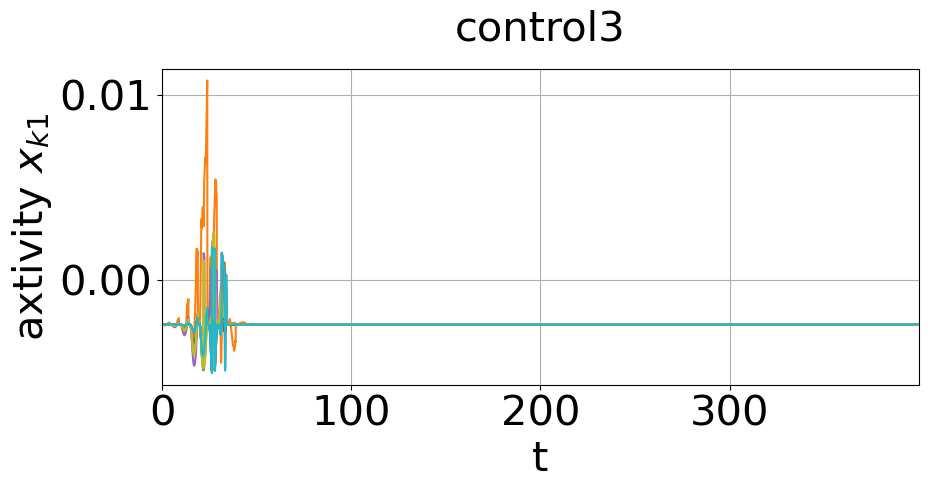

In [98]:
tensor_control4 = torch.cat(total_control4, dim=0)
create_plot(tensor_control4,'axtivity $x_{k1}$','control3')
plt.show()

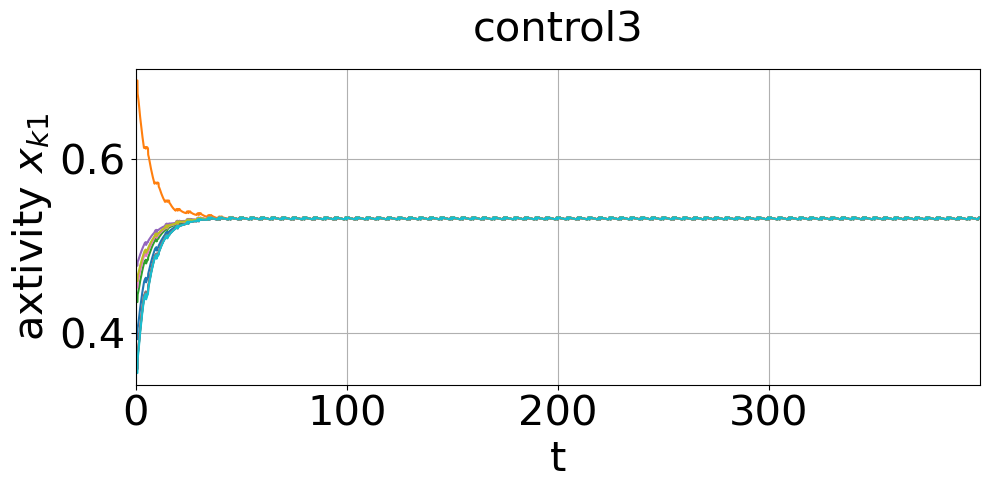

In [100]:
tensor_traj4 = torch.cat(total_controlled_traj4, dim=0)
create_plot(tensor_traj4[:,0,:],'axtivity $x_{k1}$','control3')
plt.show()

In [94]:
total_control3, total_controlled_traj3 = MPC_controller(rollout_length=50,**args)

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0013, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0013, -0.0013, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0012, -0.0013, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0034, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013, -0.0013, -0.0013,
        -0.0015, -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0015, -0.0015, -0.0014, -0.0014, -0.0013, -0.0013,
        -0.0013, -0.0013, -0.0

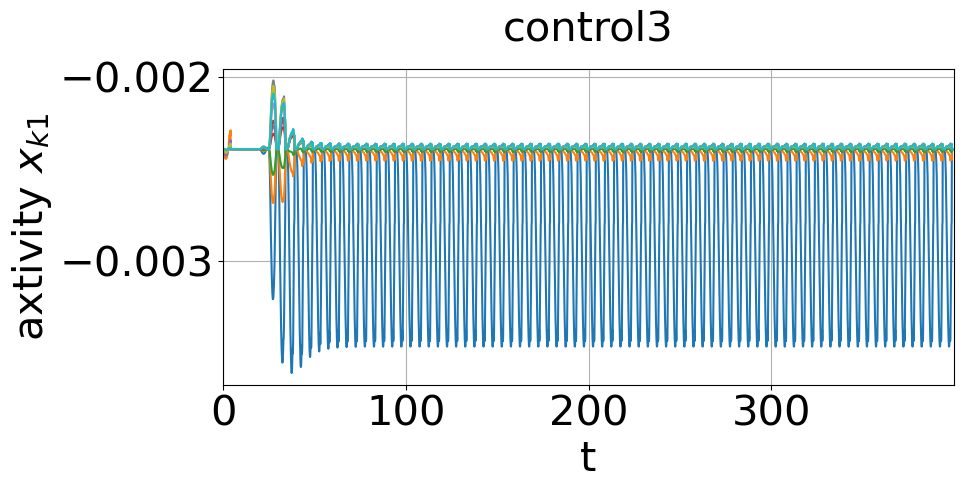

In [95]:
tensor_control3 = torch.cat(total_control3, dim=0)
create_plot(tensor_control3,'axtivity $x_{k1}$','control3')
plt.show()

In [28]:
total_control, total_controlled_traj = MPC_controller(rollout_length=50,**args)

/var/folders/rr/j6h778k96l3cmvkjn2gmtjt40000gn/T/ipykernel_64145/785693034.py:34: UserWarning: The use of `x.T` on tensors of dimension other than 2 to reverse their shape is deprecated and it will throw an error in a future release. Consider `x.mT` to transpose batches of matrices or `x.permute(*torch.arange(x.ndim - 1, -1, -1))` to reverse the dimensions of a tensor. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/TensorShape.cpp:3575.)
  pred = model(x.T,edge_index,edge_attr)[0]


Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0013, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0012, -0.0014, -0.0015, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0012, -0.0014,
        -0.0015, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 13: tensor([-0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028, -0.0029, -0.0029,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028, -0.0028,
        -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0028,
        -0.0028, -0.0028, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029, -0.0029,
        -0.0029, -0.0028, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

In [29]:
total_control

[tensor([[-2.4291e-03, -2.4952e-03, -2.4394e-03, -2.4202e-03, -2.3311e-03,
          -2.4209e-03, -2.4260e-03, -2.4196e-03, -2.4089e-03, -2.4194e-03],
         [-2.4710e-03, -2.5913e-03, -2.4955e-03, -2.4514e-03, -2.2535e-03,
          -2.4530e-03, -2.4679e-03, -2.4500e-03, -2.4307e-03, -2.4496e-03],
         [-2.5119e-03, -2.6763e-03, -2.5515e-03, -2.4816e-03, -2.1736e-03,
          -2.4840e-03, -2.5105e-03, -2.4795e-03, -2.4534e-03, -2.4788e-03],
         [-2.5524e-03, -2.7541e-03, -2.6080e-03, -2.5113e-03, -2.0916e-03,
          -2.5145e-03, -2.5542e-03, -2.5085e-03, -2.4770e-03, -2.5076e-03],
         [-2.6259e-03, -2.8950e-03, -2.7099e-03, -2.5651e-03, -1.9437e-03,
          -2.5699e-03, -2.6329e-03, -2.5610e-03, -2.5197e-03, -2.5596e-03],
         [-2.6748e-03, -2.9655e-03, -2.7810e-03, -2.6002e-03, -1.8347e-03,
          -2.6060e-03, -2.6898e-03, -2.5951e-03, -2.5518e-03, -2.5934e-03],
         [-2.7264e-03, -3.0350e-03, -2.8566e-03, -2.6370e-03, -1.7178e-03,
          -2.6440e-

In [34]:
tensor_traj = torch.cat(total_controlled_traj, dim=0)

In [40]:
tensor_control = torch.cat(total_control, dim=0)

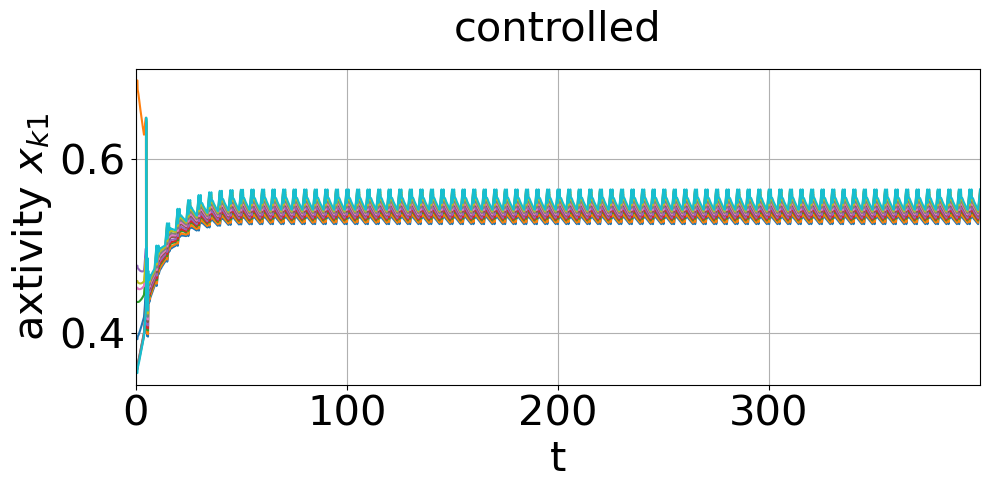

In [38]:
create_plot(tensor_traj[:,0,:].detach(),'axtivity $x_{k1}$','controlled')
plt.show()

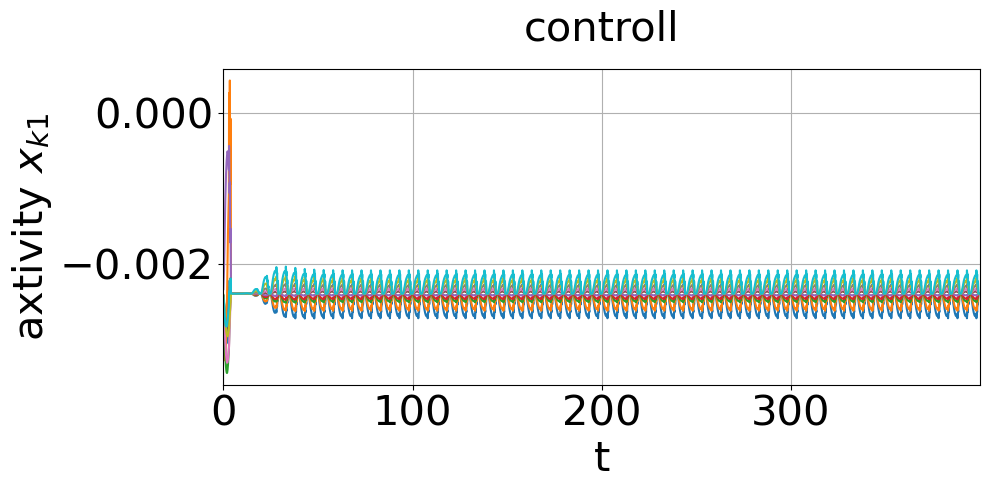

In [42]:
create_plot(tensor_control,'axtivity $x_{k1}$','controll')
plt.show()

In [43]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = MetaLayer(EdgeModel(), NodeModel()).to(device)
model.load_state_dict(torch.load('b10f10_l2_control'))
for param in model.parameters():
    param.requires_grad = False

In [44]:
total_control1, total_controlled_traj1 = MPC_controller(rollout_length=50,**args)

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0013, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0013, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0013, -0.0014, -0.0014, -0.0014, -0.0015, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0012, -0.0014, -0.0015, -0.0014,
        -0.0015, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0012, -0.0014,
        -0.0015, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 14: tensor([-0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0033, -0.0032,
        -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0031, -0.0031,
        -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0031, -0.0031, -0.0033, -0.0033, -0.0032, -0.0032, -0.0032, -0.0032,
        -0.0032, -0.0031, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

Epoch 12: tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014, -0.0014,
        -0.0014, -0.0014, -0.0

In [45]:
tensor_control1 = torch.cat(total_control1, dim=0)

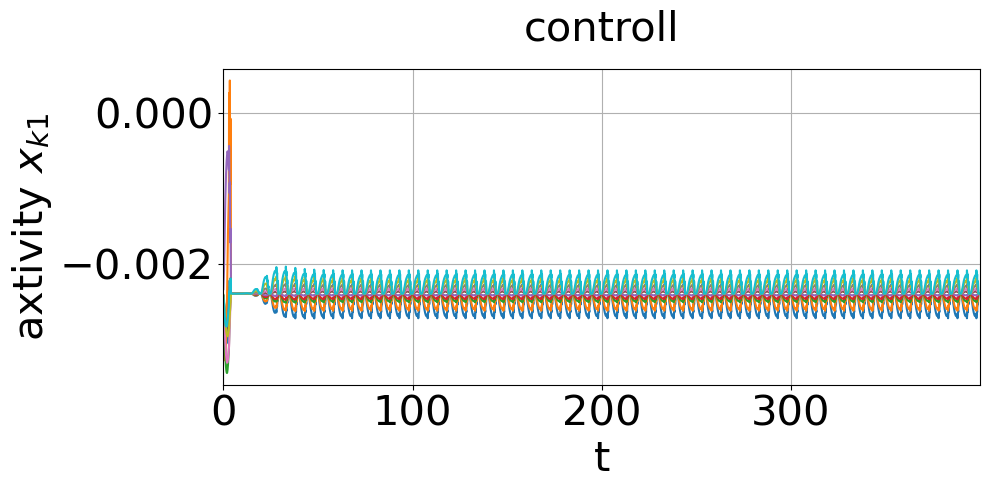

In [46]:
create_plot(tensor_control1,'axtivity $x_{k1}$','controll')
plt.show()

In [90]:
# node_ic is k-steps long
def MPC_RHC(rollout_length, num_control_epochs=15,control_application_steps=10,max_k=1000, **args):
    tsteps = args['tsteps'] # timesteps, int
    dt = args['dt'] # stepsize of timesteps, float
    N = args['N'] # number of nodes, int
    d = args['d'] # dimension of oscillator dynamics, int
    target_output = args['target_output'] # desired/target state, array shape(tsteps,N)
    node_ic= args['node_ic'] # initial conditions of the network dynamics, array shape(d,N)

    # Calculate the total number of rollouts
    num_rollouts = int(tsteps / control_application_steps)
    
    # Set the time horizon for the current rollout
    args['tsteps'] = rollout_length

    current_state = node_ic
    total_control = []
    total_controlled_traj = []

    for rollout in range(num_rollouts):
        control = torch.ones(rollout_length*N, requires_grad=True)
        control.data *= -0.002
        optimizer = torch.optim.Adam([control], lr=0.01)
        
        for epoch in range(num_control_epochs):
            optimizer.zero_grad()
            loss = sync_loss(control, rollout_length, d, dt, N, I_p, I_e, I_s, A, target_output, node_ic)
            loss.backward(retain_graph=True)
        control = control.detach().reshape(rollout_length, N)
        
        # Consider only the first control or a few initial ones based on control_application_steps
        applied_control = control[:control_application_steps]
        
        total_control.append(applied_control)
        
        # Propagate the system with the optimized control for control_application_steps
        pred_traj = torch.zeros(control_application_steps, 2, N)
        pred_traj[:look_back,:,:] = node_ic
        control_expanded = applied_control.unsqueeze(1)
        
        for i in range(control_application_steps-(look_back+look_forward)+1):
            x = torch.cat((pred_traj[i:i+look_back,:,:], control_expanded[i:i+look_back,:,:]), dim=1)
            pred = model(x.T, edge_index, edge_attr)[0]
            pred_traj[i+look_back:i+look_back+look_forward,:,:] = pred.T
            
        total_controlled_traj.append(pred_traj)
        
        # Update the state for the next control optimization
        node_ic = pred_traj[-look_back:,:,:]

    return total_control, total_controlled_traj

In [91]:
for param in model.parameters():
    param.requires_grad = False
total_control2, total_controlled_traj2 = MPC_RHC(rollout_length=50,**args)

/var/folders/rr/j6h778k96l3cmvkjn2gmtjt40000gn/T/ipykernel_64145/3761200564.py:13: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim(minn-add,maxx+add)


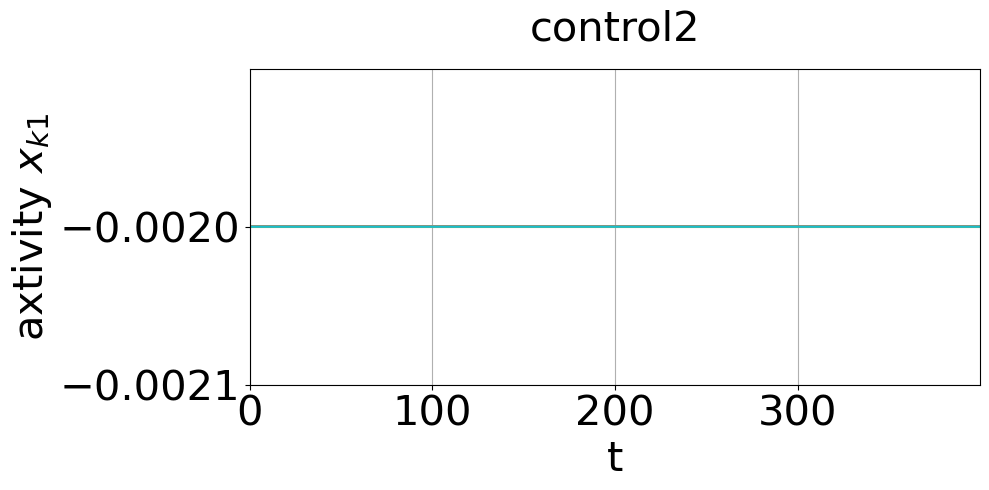

In [92]:
tensor_control2 = torch.cat(total_control2, dim=0)
create_plot(tensor_control2,'axtivity $x_{k1}$','control2')
plt.show()